In [1]:
!pip install wandb -qU

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 35.4 MB/s eta 0:00:00


In [2]:
# Log in to your W&B account
import wandb
import random
import math

wandb.login()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

# Their Dataset

In [3]:
import os
import shutil

# Define variables
repo_url = "https://github.com/killercookiee/DeepM/archive/refs/heads/main.zip"
repo_zip = "DeepM-main.zip"
target_folder = "DeepM-main/TransFuse-baseline"
output_folder = "/content/TransFuse-baseline"

# Download the repository as a ZIP file
print("Downloading the repository...")
!wget -q $repo_url -O $repo_zip

# Extract only the desired folder
print("Extracting the UNETR_baseline folder...")
!unzip -q -n $repo_zip "$target_folder/*" -d .

# Move the extracted folder to the desired output directory
if os.path.exists(output_folder):
    shutil.rmtree(output_folder)
shutil.move(f"DeepM-main/TransFuse-baseline", output_folder)

# Remove the unwanted file
excluded_file = os.path.join(output_folder, "TransFuse-baseline.ipynb")
if os.path.exists(excluded_file):
    os.remove(excluded_file)

# Clean up
os.remove(repo_zip)
shutil.rmtree("DeepM-main", ignore_errors=True)

# Verify the final contents of the folder
print("Contents of the TransFuse folder:")
!ls -la $output_folder

import sys
sys.path.append('/content/TransFuse-baseline')

Extracting the UNETR_baseline folder...
Contents of the TransFuse folder:
total 7268
drwxr-xr-x 7 root root    4096 Dec  9 18:50 .
drwxr-xr-x 1 root root    4096 Dec 10 12:24 ..
-rw-r--r-- 1 root root 1869227 Dec  9 18:50 DeepM_TransFuse_baseline.ipynb
-rw-r--r-- 1 root root    8196 Dec  9 18:50 .DS_Store
-rw-r--r-- 1 root root     379 Dec  9 18:50 .gitignore
drwxr-xr-x 2 root root    4096 Dec  9 18:50 imgs
drwxr-xr-x 3 root root    4096 Dec  9 18:50 lib
-rw-r--r-- 1 root root    1190 Dec  9 18:50 process.py
drwxr-xr-x 2 root root    4096 Dec  9 18:50 __pycache__
-rw-r--r-- 1 root root    2360 Dec  9 18:50 README.md
drwxr-xr-x 2 root root    4096 Dec  9 18:50 save
-rw-r--r-- 1 root root    2886 Dec  9 18:50 test_isic.py
-rw-r--r-- 1 root root    5687 Dec  9 18:50 train_isic.py
-rw-r--r-- 1 root root 5502978 Dec  9 18:50 TransFuse_baseline_Colab.ipynb
drwxr-xr-x 3 root root    4096 Dec  9 18:50 utils


In [4]:
!pip install gdown

In [5]:
import gdown
import zipfile
import os

# Define the URL and target path
file_id = '120hxkYc0vfzoSf4kYC6zpC7FH7XCVXqK'
download_url = f'https://drive.google.com/uc?export=download&id={file_id}'
zip_path = '/content/temp_file.zip'
target_folder = '/content/TransFuse-baseline/data'

# Download the zip file
gdown.download(download_url, zip_path, quiet=False)

# Create the target folder if it doesn't exist
os.makedirs(target_folder, exist_ok=True)

# Extract the zip file into the target folder
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(target_folder)

# Optionally, remove the zip file after extraction
os.remove(zip_path)

Downloading...
From (original): https://drive.google.com/uc?export=download&id=120hxkYc0vfzoSf4kYC6zpC7FH7XCVXqK
From (redirected): https://drive.google.com/uc?export=download&id=120hxkYc0vfzoSf4kYC6zpC7FH7XCVXqK&confirm=t&uuid=a561d9b1-dbfb-4fc3-8af5-f78a1eee24fe
To: /content/temp_file.zip
100%|██████████| 300M/300M [00:03<00:00, 92.4MB/s]


In [6]:
# Define the URL and target path
file_id = '1hv1mfFkWEdYCR0FHPokovlf7OAFsnKgY'  # Extracted from the shared URL
download_url = f'https://drive.google.com/uc?export=download&id={file_id}'
target_folder = '/content/TransFuse-baseline/snapshots'
target_file = os.path.join(target_folder, 'TransFuse-19_best.pth')  # You can name the file as needed

# Create the target folder if it doesn't exist
os.makedirs(target_folder, exist_ok=True)

# Download the .pth file
gdown.download(download_url, target_file, quiet=False)


Downloading...
From (original): https://drive.google.com/uc?export=download&id=1hv1mfFkWEdYCR0FHPokovlf7OAFsnKgY
From (redirected): https://drive.google.com/uc?export=download&id=1hv1mfFkWEdYCR0FHPokovlf7OAFsnKgY&confirm=t&uuid=6a559cae-2702-42ee-87b5-e71ac9e7a3b3
To: /content/TransFuse-baseline/snapshots/TransFuse-19_best.pth
100%|██████████| 105M/105M [00:01<00:00, 72.5MB/s]


'/content/TransFuse-baseline/snapshots/TransFuse-19_best.pth'

In [7]:
# Define the URL and target path
url = 'https://download.pytorch.org/models/resnet34-333f7ec4.pth'
target_folder = '/content/TransFuse-baseline/pretrained'
target_file = os.path.join(target_folder, 'resnet34-333f7ec4.pth')

# Create the target folder if it doesn't exist
os.makedirs(target_folder, exist_ok=True)

# Download the .pth file using wget
!wget -q -O $target_file $url

In [8]:
# Define the URL and target path
url = 'https://dl.fbaipublicfiles.com/deit/deit_small_patch16_224-cd65a155.pth'
target_folder = '/content/TransFuse-baseline/pretrained'
target_file = os.path.join(target_folder, 'deit_small_patch16_224-cd65a155.pth')

# Create the target folder if it doesn't exist
os.makedirs(target_folder, exist_ok=True)

# Download the .pth file using wget
!wget -q -O $target_file $url


## Testing

In [9]:
import torch
import torch.nn.functional as F
import numpy as np
import os, argparse
from lib.TransFuse import TransFuse_S, TransFuse_L, TransFuse_L_384
from utils.dataloader import test_dataset
import imageio


def mean_dice_np(gt, pred, num_classes):
    dice_scores = []
    for c in range(num_classes):
        gt_c = (gt == c)
        pred_c = (pred == c)
        intersection = np.sum(gt_c & pred_c)
        union = np.sum(gt_c) + np.sum(pred_c)
        dice_scores.append(2 * intersection / union if union > 0 else 1.0)
    return np.mean(dice_scores)

def mean_iou_np(gt, pred, num_classes):
    iou_scores = []
    for c in range(num_classes):
        gt_c = (gt == c)
        pred_c = (pred == c)
        intersection = np.sum(gt_c & pred_c)
        union = np.sum(gt_c | pred_c)
        iou_scores.append(intersection / union if union > 0 else 1.0)
    return np.mean(iou_scores)


/usr/local/lib/python3.10/dist-packages/timm/models/helpers.py:7: FutureWarning: Importing from timm.models.helpers is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.10/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.10/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/content/TransFuse-baseline/lib/vision_transformer.py:260: UserWarning: Overwriting vit_small_patch16_224 in registry with lib.vision_transformer.vit_small_patch16_224. This is because the 

In [10]:
# Argument Inputs

ckpt_path = '/content/TransFuse-baseline/snapshots/TransFuse-19_best.pth'   # Path to the checkpoint
test_path = '/content/TransFuse-baseline/data'     # Path to test dataset
save_path = '/content/TransFuse-baseline/save'        # Path to save inference segmentation

In [11]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

num_classes = 1

model = TransFuse_S(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(ckpt_path, map_location=device))
model.eval()

if save_path is not None:
    os.makedirs(save_path, exist_ok=True)

Using device: cuda


<ipython-input-11-e86b0a2d9c2d>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(ckpt_path, map_location=device))


In [12]:
print('Evaluating model:', ckpt_path)

image_root = f'{test_path}/data_test.npy'
gt_root = f'{test_path}/mask_test.npy'
test_loader = test_dataset(image_root, gt_root, num_classes)

# Prepare storage for predictions
all_images = []
all_gts = []
all_predictions = []

dice_bank = []
iou_bank = []
acc_bank = []

for i in range(test_loader.size):
    # Load data
    image, gt = test_loader.load_data()
    gt = (gt > 0.5).astype(np.uint8)  # Binary mask

    # Move image to the device
    image = image.to(device)

    with torch.no_grad():
        _, _, res = model(image)

    res = res.sigmoid().data.cpu().numpy().squeeze()  # Shape: (height, width)
    res = (res > 0.5).astype(np.uint8)  # Threshold to binary

    # Save predictions for later visualization
    all_images.append(image.squeeze(0).permute(1, 2, 0).cpu().numpy())  # Convert tensor to NumPy
    all_gts.append(gt)
    all_predictions.append(res)

    # Save predictions if save_path is set
    if save_path is not None:
        pred_npy_path = f'{save_path}/predicted_test.npy'
        np.save(pred_npy_path, np.array(all_predictions))

    # Compute metrics
    dice = mean_dice_np(gt, res, num_classes=num_classes)
    iou = mean_iou_np(gt, res, num_classes=num_classes)
    acc = np.sum(res == gt) / (res.shape[0] * res.shape[1])

    acc_bank.append(acc)
    dice_bank.append(dice)
    iou_bank.append(iou)

print('Dice: {:.4f}, IoU: {:.4f}, Acc: {:.4f}'.
      format(np.mean(dice_bank), np.mean(iou_bank), np.mean(acc_bank)))

Evaluating model: /content/TransFuse-baseline/snapshots/TransFuse-19_best.pth
Dice: 0.9493, IoU: 0.9138, Acc: 0.9468


## Visualization

In [13]:
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def visualize_samples_binary(image_path, gt_path, pred_path, sample_count=5):
    """
    Visualize random samples of images, ground truth masks, and predictions from .npy files.

    Args:
        image_path (str): Path to the .npy file containing images.
        gt_path (str): Path to the .npy file containing ground truth masks.
        pred_path (str): Path to the .npy file containing predicted masks.
        sample_count (int): Number of samples to visualize.
    """
    # Load the data from .npy files
    images = np.load(image_path)  # Shape: (N, H, W, 3), dtype: uint8
    gts = np.load(gt_path)  # Shape: (N, H, W), dtype: uint8
    predictions = np.load(pred_path)  # Shape: (N, H, W), dtype: uint8

    # Randomly sample indices
    indices = random.sample(range(len(images)), sample_count)
    for idx in indices:
        # Retrieve image, ground truth, and prediction
        image = images[idx]  # Already in 0–255 range
        gt = gts[idx]
        pred = predictions[idx]

        # Convert image to range 0–1 for matplotlib (optional for uint8)
        image = image / 255.0

        # Display the images
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image)
        axes[0].set_title('Original Image')
        axes[1].imshow(gt, cmap='gray')
        axes[1].set_title('Ground Truth Mask')
        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        for ax in axes:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

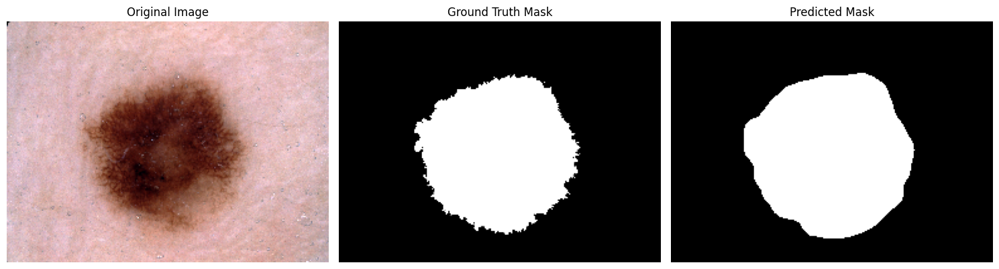

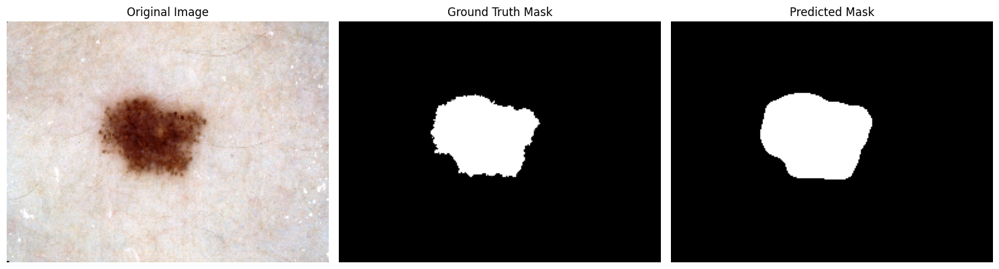

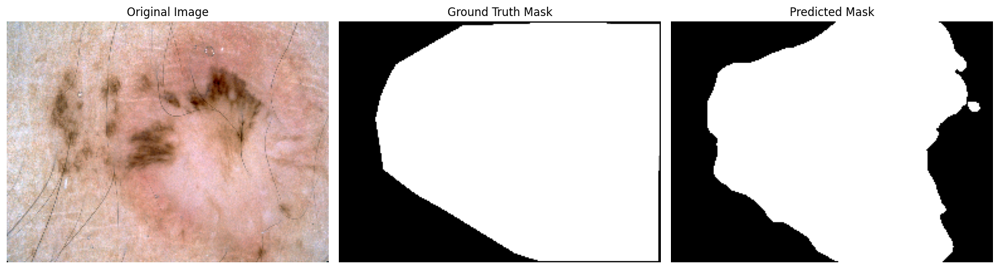

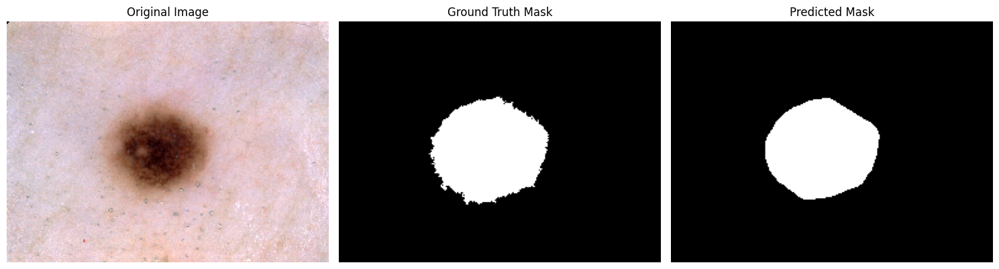

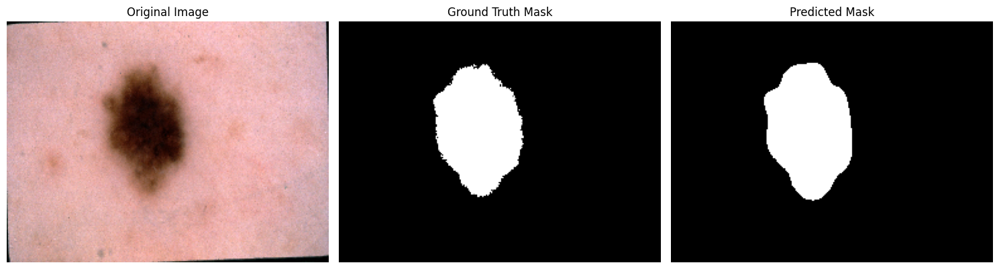

In [14]:
# Paths to .npy files
image_npy = f'{test_path}/data_test.npy'
gt_npy = f'{test_path}/mask_test.npy'
pred_npy = f'{save_path}/predicted_test.npy'

visualize_samples_binary(image_npy, gt_npy, pred_npy, sample_count=5)

## Training

In [15]:
import torch.utils.data as data
import torchvision.transforms as transforms
import albumentations as A


class SkinDataset(data.Dataset):
    """
    dataloader for skin lesion segmentation tasks
    """
    def __init__(self, image_root, gt_root, num_classes=5):
        self.images = np.load(image_root)
        self.gts = np.load(gt_root)
        self.size = len(self.images)
        self.num_classes = num_classes

        self.img_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225])
        ])
        self.gt_transform = transforms.Compose([
            transforms.ToTensor()])

        self.transform = A.Compose(
            [
                A.ShiftScaleRotate(shift_limit=0.15, scale_limit=0.15, rotate_limit=25, p=0.5, border_mode=0),
                A.ColorJitter(),
                A.HorizontalFlip(),
                A.VerticalFlip()
            ]
        )

    def one_hot_encode(self, mask):
        """
        Converts a single-channel mask to one-hot encoding with num_classes channels.
        """
        h, w = mask.shape
        one_hot = np.zeros((self.num_classes, h, w), dtype=np.uint8)
        for i in range(self.num_classes):
          one_hot[i] = (mask == i).astype(np.uint8)
        return one_hot

    def __getitem__(self, index):

        image = self.images[index]
        gt = self.gts[index]
        gt = gt / 255.0

        # Handle grayscale images (convert to 3 channels if necessary)
        if len(image.shape) == 2:  # Grayscale image (height, width)
            image = np.expand_dims(image, axis=-1)  # Convert to (height, width, 1)
            image = np.repeat(image, 3, axis=-1)  # Convert to (height, width, 3) by repeating

        # Apply augmentations
        transformed = self.transform(image=image, mask=gt)
        image = self.img_transform(transformed['image'])
        gt = transformed['mask']

        # Dynamically one-hot encode the mask
        gt_one_hot = self.one_hot_encode(gt)
        gt_one_hot = torch.from_numpy(gt_one_hot)  # Convert to tensor

        return image, gt_one_hot

    def __len__(self):
        return self.size


def get_loader(image_root, gt_root, batchsize, shuffle=True, num_workers=4, pin_memory=True, num_classes=2):

    dataset = SkinDataset(image_root, gt_root, num_classes=num_classes)
    data_loader = data.DataLoader(dataset=dataset,
                                  batch_size=batchsize,
                                  shuffle=shuffle,
                                  num_workers=num_workers,
                                  pin_memory=pin_memory)
    return data_loader

class test_dataset:
    def __init__(self, image_root, gt_root, num_classes=2):
        self.images = np.load(image_root)
        self.gts = np.load(gt_root)

        self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225])
        ])
        self.num_classes = num_classes
        self.size = len(self.images)
        self.index = 0

    def load_data(self):
        # Load the current image and mask
        image = self.images[self.index]
        image = self.transform(image).unsqueeze(0)
        gt = self.gts[self.index]

        # Convert grayscale to RGB if needed
        if len(image.shape) == 2:  # Grayscale image
            image = np.stack([image] * 3, axis=-1)  # Convert to RGB

        # Normalize GT mask
        gt = gt / 255.0  # Normalize to range [0, 1]

        # Handle multi-class masks if required
        if self.num_classes > 1:
            gt = torch.tensor(gt, dtype=torch.long)  # Convert to long type
            gt = torch.nn.functional.one_hot(gt, num_classes=self.num_classes).permute(2, 0, 1).float()

        self.index += 1
        return image, gt

    def __len__(self):
        return self.size

In [16]:
import torch
from torch.autograd import Variable
import argparse
from datetime import datetime
from lib.TransFuse import TransFuse_S, TransFuse_L, TransFuse_L_384
from utils.utils import AvgMeter
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import os


def structure_loss(pred, mask):
    mask = mask.float()
    weit = 1 + 5*torch.abs(F.avg_pool2d(mask, kernel_size=31, stride=1, padding=15) - mask)
    wbce = F.binary_cross_entropy_with_logits(pred, mask, reduction='none')
    wbce = (weit*wbce).sum(dim=(2, 3)) / weit.sum(dim=(2, 3))

    pred = torch.sigmoid(pred)
    inter = ((pred * mask)*weit).sum(dim=(2, 3))
    union = ((pred + mask)*weit).sum(dim=(2, 3))
    wiou = 1 - (inter + 1)/(union - inter+1)
    return (wbce + wiou).mean()


def train(train_loader, model, optimizer, epoch, best_loss):
    model.train()
    loss_record2, loss_record3, loss_record4 = AvgMeter(), AvgMeter(), AvgMeter()
    accum = 0
    for i, pack in enumerate(train_loader, start=1):
        # ---- data prepare ----
        images, gts = pack
        images = Variable(images).cuda()
        gts = Variable(gts).cuda()

        # ---- forward ----
        lateral_map_4, lateral_map_3, lateral_map_2 = model(images)

        # ---- loss function ----
        loss4 = structure_loss(lateral_map_4, gts)
        loss3 = structure_loss(lateral_map_3, gts)
        loss2 = structure_loss(lateral_map_2, gts)

        loss = 0.5 * loss2 + 0.3 * loss3 + 0.2 * loss4

        # ---- backward ----
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), grad_norm)
        optimizer.step()
        optimizer.zero_grad()

        # ---- recording loss ----
        loss_record2.update(loss2.data, batchsize)
        loss_record3.update(loss3.data, batchsize)
        loss_record4.update(loss4.data, batchsize)

        # ---- train visualization ----
        if i % 20 == 0 or i == total_step:
            print('{} Epoch [{:03d}/{:03d}], Step [{:04d}/{:04d}], '
                  '[lateral-2: {:.4f}, lateral-3: {:0.4f}, lateral-4: {:0.4f}]'.
                  format(datetime.now(), epoch, max_epoch, i, total_step,
                         loss_record2.show(), loss_record3.show(), loss_record4.show()))

    save_path = '{}/{}/'.format(model_save_path, train_save)
    os.makedirs(save_path, exist_ok=True)
    if (epoch+1) % 1 == 0:
        meanloss = test(model, test_path)
        if meanloss < best_loss:
            print('new best loss: ', meanloss)
            best_loss = meanloss
            torch.save(model.state_dict(), save_path + 'TransFuse-S_test_best.pth')
            print('[Saving Snapshot:]', save_path + 'TransFuse-S_test_best.pth')
    return best_loss


def test(model, path):

    model.eval()
    mean_loss = []

    for s in ['val', 'test']:
        image_root = '{}/data_{}.npy'.format(path, s)
        gt_root = '{}/mask_{}.npy'.format(path, s)
        test_loader = test_dataset(image_root, gt_root, num_classes=num_classes)

        dice_bank = []
        iou_bank = []
        loss_bank = []
        acc_bank = []

        for i in range(test_loader.size):
            image, gt = test_loader.load_data()
            image = Variable(image).cuda()
            gt = Variable(gt).cuda()

            with torch.no_grad():
                _, _, res = model(image)
            loss = structure_loss(res, torch.tensor(gt).unsqueeze(0).cuda())

            res = res.sigmoid().data.cpu().numpy().squeeze()
            gt = gt.cpu().numpy()  # Ensure `gt` is also a NumPy array

            gt = 1*(gt>0.5)
            res = 1*(res > 0.5)

            dice = mean_dice_np(gt, res, num_classes=num_classes)
            iou = mean_iou_np(gt, res, num_classes=num_classes)
            acc = np.sum(res == gt) / (res.shape[0]*res.shape[1])

            loss_bank.append(loss.item())
            dice_bank.append(dice)
            iou_bank.append(iou)
            acc_bank.append(acc)

        print('{} Loss: {:.4f}, Dice: {:.4f}, IoU: {:.4f}, Acc: {:.4f}'.
            format(s, np.mean(loss_bank), np.mean(dice_bank), np.mean(iou_bank), np.mean(acc_bank)))

        mean_loss.append(np.mean(loss_bank))

    return mean_loss[0]

In [17]:
# Inputs
max_epoch = 1               # epoch number
lr = 7e-5               # learning rate
batchsize = 16          # batch size
grad_norm = 2.0         # gradient clipping norm
train_path = '/content/TransFuse-baseline/data'        # Path to training dataset
test_path = '/content/TransFuse-baseline/data'         # Path to testing dataset
model_save_path = '/content/TransFuse-baseline/snapshots'
train_save = 'TransFuse_S'  # Name of training snapshot
beta1 = 0.5             # Adam optimizer beta1
beta2 = 0.999           # Adam optimizer beta2
num_classes = 2          # Number of classes



In [18]:
pretrained_folder_path = "/content/TransFuse-baseline/pretrained"
pretrained_model = os.path.join(pretrained_folder_path, "resnet34-333f7ec4.pth")
pretrained_transformer = os.path.join(pretrained_folder_path, "deit_small_patch16_224-cd65a155.pth")

model = TransFuse_S(num_classes=num_classes,pretrained=True, pretrained_model=pretrained_model, pretrained_transformer=pretrained_transformer).cuda()
params = model.parameters()
optimizer = torch.optim.Adam(params, lr, betas=(beta1, beta2))

image_root = '{}/data_train.npy'.format(train_path)
gt_root = '{}/mask_train.npy'.format(train_path)

train_loader = get_loader(image_root, gt_root, batchsize=batchsize, num_classes=num_classes)
total_step = len(train_loader)

print("#"*20, "Start Training", "#"*20)

best_loss = 1e5
for epoch in range(1, max_epoch + 1):
    best_loss = train(train_loader, model, optimizer, epoch, best_loss)


/content/TransFuse-baseline/lib/TransFuse.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.resnet.load_state_dict(torch.load(pretrained_model))


#################### Start Training ####################


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


2024-12-10 12:26:00.042432 Epoch [001/001], Step [0020/0125], [lateral-2: 1.2818, lateral-3: 1.1483, lateral-4: 1.3100]
2024-12-10 12:26:05.422559 Epoch [001/001], Step [0040/0125], [lateral-2: 1.0804, lateral-3: 0.9973, lateral-4: 1.1390]
2024-12-10 12:26:10.818180 Epoch [001/001], Step [0060/0125], [lateral-2: 0.8173, lateral-3: 0.7977, lateral-4: 0.8978]
2024-12-10 12:26:16.220916 Epoch [001/001], Step [0080/0125], [lateral-2: 0.7079, lateral-3: 0.7087, lateral-4: 0.7776]
2024-12-10 12:26:21.659289 Epoch [001/001], Step [0100/0125], [lateral-2: 0.6340, lateral-3: 0.6461, lateral-4: 0.6973]
2024-12-10 12:26:27.089800 Epoch [001/001], Step [0120/0125], [lateral-2: 0.5779, lateral-3: 0.5969, lateral-4: 0.6321]
2024-12-10 12:26:28.452998 Epoch [001/001], Step [0125/0125], [lateral-2: 0.5747, lateral-3: 0.5941, lateral-4: 0.6267]


<ipython-input-16-1dab435c3534>:98: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  loss = structure_loss(res, torch.tensor(gt).unsqueeze(0).cuda())


val Loss: 0.5703, Dice: 0.9466, IoU: 0.9106, Acc: 242.3321
test Loss: 0.6440, Dice: 0.9201, IoU: 0.8698, Acc: 235.5482
new best loss:  0.5703180819749832
[Saving Snapshot:] /content/TransFuse-baseline/snapshots/TransFuse_S/TransFuse-S_test_best.pth


## Evaluation

In [19]:
# Argument Inputs

ckpt_path = '/content/TransFuse-baseline/snapshots/TransFuse_S/TransFuse-S_test_best.pth'   # Path to the checkpoint
test_path = '/content/TransFuse-baseline/data'     # Path to test dataset
save_path = '/content/TransFuse-baseline/own_save'        # Path to save inference segmentation

os.makedirs(test_path, exist_ok=True)
os.makedirs(save_path, exist_ok=True)

In [20]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

num_classes = 2

model = TransFuse_S(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(ckpt_path, map_location=device))
model.eval()

if save_path is not None:
    os.makedirs(save_path, exist_ok=True)

Using device: cuda


<ipython-input-20-d5426ad863f8>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(ckpt_path, map_location=device))


In [21]:
print('Evaluating model:', ckpt_path)

image_root = f'{test_path}/data_test.npy'
gt_root = f'{test_path}/mask_test.npy'
test_loader = test_dataset(image_root, gt_root, num_classes)

# Prepare storage for predictions
all_images = []
all_gts = []
all_predictions = []

dice_bank = []
iou_bank = []
acc_bank = []

for i in range(test_loader.size):
    # Load data
    image, gt = test_loader.load_data()

    # Move image to the device
    image = image.to(device)

    with torch.no_grad():
        _, _, res = model(image)

    # Apply softmax to get the class probabilities and take the class with the highest probability
    res = res.softmax(dim=1)  # Assuming res has shape [batch_size, num_classes, height, width]
    res = torch.argmax(res, dim=1).cpu().numpy()  # Convert to class labels

    # Convert ground truth to class labels (do not apply thresholding, it's already categorical)
    gt = gt.cpu().numpy()  # Ensure the ground truth is on CPU and converted to numpy

    # Save predictions for later visualization
    all_images.append(image.squeeze(0).permute(1, 2, 0).cpu().numpy())  # Convert tensor to NumPy
    all_gts.append(gt)
    all_predictions.append(res)
    if i % 100 == 0:
      print(f"Images processed:{i}")

    # Compute metrics
    dice = mean_dice_np(gt, res, num_classes=num_classes)
    iou = mean_iou_np(gt, res, num_classes=num_classes)
    acc = np.sum(res == gt) / (res.shape[0] * res.shape[1])

    acc_bank.append(acc)
    dice_bank.append(dice)
    iou_bank.append(iou)

# Save predictions once at the end
if save_path is not None:
    pred_npy_path = f'{save_path}/predicted_test.npy'
    np.save(pred_npy_path, np.array(all_predictions))  # Save all predictions at once
    print(f"Predictions saved to {pred_npy_path}")

# Final metrics
print('Dice: {:.4f}, IoU: {:.4f}, Acc: {:.4f}'.
      format(np.mean(dice_bank), np.mean(iou_bank), np.mean(acc_bank)))


Evaluating model: /content/TransFuse-baseline/snapshots/TransFuse_S/TransFuse-S_test_best.pth
Images processed:0
Images processed:100
Images processed:200
Images processed:300
Images processed:400
Images processed:500
Predictions saved to /content/TransFuse-baseline/own_save/predicted_test.npy
Dice: 0.5789, IoU: 0.2894, Acc: 256.0000


In [22]:
from scipy import stats

# Convert all predictions to a single array (flattened)
all_predictions_flat = np.concatenate(all_predictions, axis=None)

# Compute Mean
mean_value = np.mean(all_predictions_flat)

# Compute Mode
mode_value = stats.mode(all_predictions_flat)[0]

# Compute Median
median_value = np.median(all_predictions_flat)

# Compute Range (max - min)
range_value = np.max(all_predictions_flat) - np.min(all_predictions_flat)

# Output the statistics
print(f"Mean class value: {mean_value:.4f}")
print(f"Mode class value: {mode_value}")
print(f"Median class value: {median_value}")
print(f"Range of class values: {range_value}")

Mean class value: 0.1728
Mode class value: 0
Median class value: 0.0
Range of class values: 1


In [23]:
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def visualize_samples_from_npy(image_path, gt_path, pred_path, sample_count=5, num_classes=3):
    """
    Visualize random samples of images, ground truth masks, and predictions from .npy files for multi-class segmentation.

    Args:
        image_path (str): Path to the .npy file containing images.
        gt_path (str): Path to the .npy file containing ground truth masks.
        pred_path (str): Path to the .npy file containing predicted masks.
        sample_count (int): Number of samples to visualize.
        num_classes (int): Number of classes in the segmentation task.
    """
    # Load the data from .npy files
    images = np.load(image_path)  # Shape: (600, 192, 256, 3), dtype: uint8
    gts = np.load(gt_path)  # Shape: (600, 192, 256), dtype: uint8
    predictions = np.load(pred_path)  # Shape: (600, 1, 192, 256), dtype: uint8

    # Remove the extra batch dimension from predictions
    predictions = predictions.squeeze(axis=1)  # Shape: (600, 192, 256)

    # Create a color map for the multi-class labels
    cmap = plt.get_cmap('tab20', num_classes)  # A discrete colormap with a color for each class

    # Randomly sample indices
    indices = random.sample(range(len(images)), sample_count)
    for idx in indices:
        # Retrieve image, ground truth, and prediction
        image = images[idx]  # Shape: (192, 256, 3), RGB image
        gt = gts[idx]        # Shape: (192, 256), ground truth
        pred = predictions[idx]  # Shape: (192, 256), predicted mask

        # Convert image to range 0–1 for matplotlib (optional for uint8)
        image = image / 255.0

        # Create a color-mapped version of the ground truth and prediction
        gt_colored = cmap(gt)  # Convert GT to RGBA using the colormap
        pred_colored = cmap(pred)  # Convert predictions to RGBA

        # Display the images
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(image)
        axes[0].set_title('Original Image')

        axes[1].imshow(gt_colored)
        axes[1].set_title('Ground Truth Mask')

        axes[2].imshow(pred_colored)
        axes[2].set_title('Predicted Mask')

        for ax in axes:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

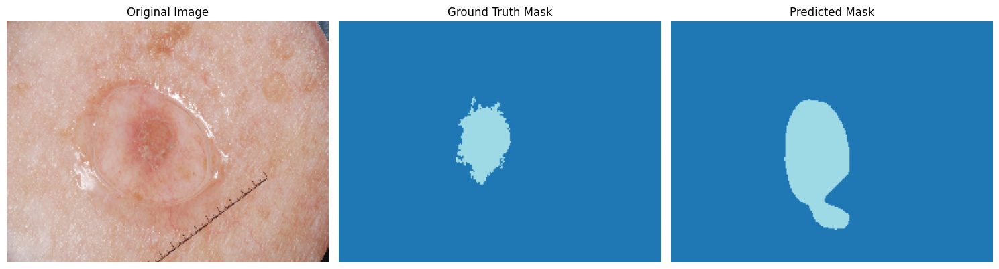

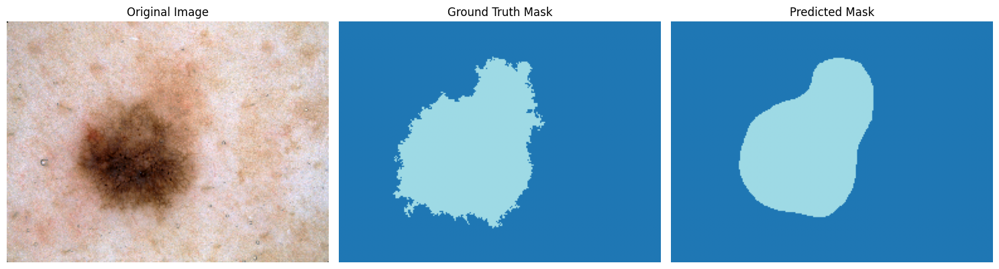

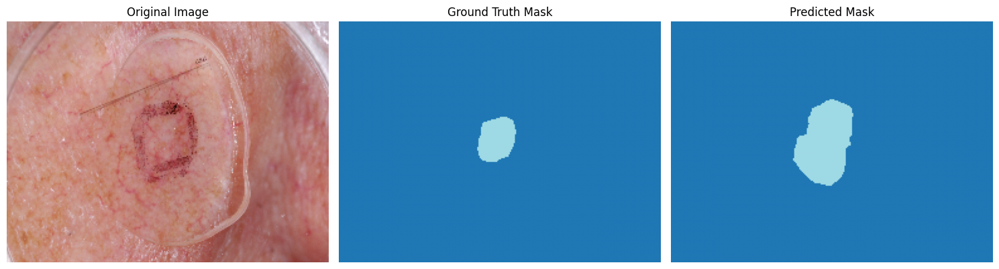

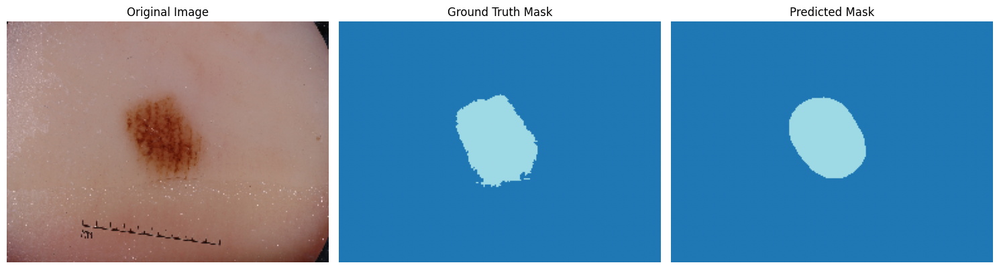

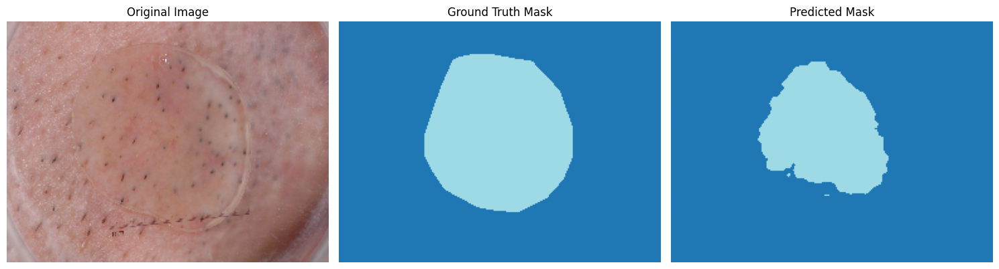

In [24]:
# Paths to .npy files
image_npy = f'{test_path}/data_test.npy'
gt_npy = f'{test_path}/mask_test.npy'
pred_npy = f'{save_path}/predicted_test.npy'

visualize_samples_from_npy(image_npy, gt_npy, pred_npy, sample_count=5, num_classes=num_classes)

# Process Our Data

In [25]:
import shutil

# Define variables
repo_url = "https://github.com/killercookiee/DeepM/archive/refs/heads/main.zip"
repo_zip = "DeepM-main.zip"
target_folder = "DeepM-main/MIS-working-database"
output_folder = "/content/MIS-working-database"

# Download the repository as a ZIP file
print("Downloading the repository...")
!wget -q $repo_url -O $repo_zip

# Extract only the desired folder
print("Extracting the UNETR_baseline folder...")
!unzip -q -n $repo_zip "$target_folder/*" -d .

# Move the extracted folder to the desired output directory
if os.path.exists(output_folder):
    shutil.rmtree(output_folder)
shutil.move(f"DeepM-main/MIS-working-database", output_folder)

# Clean up
os.remove(repo_zip)
shutil.rmtree("DeepM-main", ignore_errors=True)

# Verify the final contents of the folder
print("Contents of the MIS-working-database folder:")
!ls -la $output_folder

import sys
sys.path.append('/content/MIS-working-database')

Extracting the UNETR_baseline folder...
Contents of the MIS-working-database folder:
total 24
drwxr-xr-x  4 root root 4096 Dec  9 18:50 .
drwxr-xr-x  1 root root 4096 Dec 10 12:27 ..
-rw-r--r--  1 root root 6148 Dec  9 18:50 .DS_Store
drwxr-xr-x 52 root root 4096 Dec  9 18:50 testing
drwxr-xr-x 97 root root 4096 Dec  9 18:50 training


In [26]:
import os
import numpy as np
import nibabel as nib
import cv2
from sklearn.model_selection import train_test_split

# Paths
root = '/content/MIS-working-database'
train_folder = os.path.join(root, 'training')
test_folder = os.path.join(root, 'testing')
save_root = '/content/MIS_TransFuse_training/data'  # Folder to save .npy files

# Target dimensions
height = 192
width = 256

# Prepare save directories
os.makedirs(save_root, exist_ok=True)

# Process function
def process_data(input_folder, save_name_prefix, height, width, validation_split=False):
    images_list = []
    masks_list = []

    print(f"Processing folder: {input_folder}")

    # Iterate through patient folders
    for patient_folder in os.listdir(input_folder):
        patient_path = os.path.join(input_folder, patient_folder)

        # Check if it's a directory
        if not os.path.isdir(patient_path):
            continue

        # Identify .nii.gz files
        for file in os.listdir(patient_path):
            if file.endswith('.nii.gz') and '_gt' not in file:  # Image file
                image_path = os.path.join(patient_path, file)
                mask_path = os.path.join(patient_path, file.replace('.nii.gz', '_gt.nii.gz'))

                # Skip if mask is missing
                if not os.path.exists(mask_path):
                    print(f"Missing mask for {image_path}, skipping.")
                    continue

                # Load the image and mask
                image_nii = nib.load(image_path)
                mask_nii = nib.load(mask_path)

                # Extract 3D volumes
                image_data = image_nii.get_fdata()
                mask_data = mask_nii.get_fdata()

                # Check dimensions consistency
                if image_data.shape != mask_data.shape:
                    print(f"Shape mismatch for {image_path}, skipping.")
                    continue

                # Iterate through slices
                for slice_idx in range(image_data.shape[2]):
                    image_slice = image_data[:, :, slice_idx]
                    mask_slice = mask_data[:, :, slice_idx]

                    # Resize both image and mask
                    image_resized = cv2.resize(image_slice, (width, height), interpolation=cv2.INTER_LINEAR)
                    mask_resized = cv2.resize(mask_slice, (width, height), interpolation=cv2.INTER_NEAREST)

                    # Normalize image slice to 0-255 range
                    image_resized = cv2.normalize(image_resized, None, 0, 255, norm_type=cv2.NORM_MINMAX)
                    image_resized = image_resized.astype(np.uint8)

                    # Turn gray scale to rgb
                    image_rgb = np.stack([image_resized] * 3, axis=-1)

                    # Convert mask to uint8
                    mask_resized = mask_resized.astype(np.uint8)

                    # Add to lists
                    images_list.append(image_rgb)
                    masks_list.append(mask_resized)

    # Convert to numpy arrays
    images_array = np.stack(images_list, axis=0)
    masks_array = np.stack(masks_list, axis=0)

    if validation_split:
        # Split into training and validation sets (90% training, 10% validation)
        train_images, val_images, train_masks, val_masks = train_test_split(
            images_array, masks_array, test_size=0.1, random_state=42
        )
        # Save split data
        np.save(os.path.join(save_root, 'data_train.npy'), train_images)
        np.save(os.path.join(save_root, 'mask_train.npy'), train_masks)
        np.save(os.path.join(save_root, 'data_val.npy'), val_images)
        np.save(os.path.join(save_root, 'mask_val.npy'), val_masks)

        print(f"Saved {len(train_images)} training slices and {len(val_images)} validation slices.")
    else:
        # Save as .npy
        np.save(os.path.join(save_root, f'data_{save_name_prefix}.npy'), images_array)
        np.save(os.path.join(save_root, f'mask_{save_name_prefix}.npy'), masks_array)

        print(f"Saved {len(images_list)} slices for {save_name_prefix}.")

# Process training (with validation split) and testing sets
process_data(train_folder, 'train', height, width, validation_split=True)
process_data(test_folder, 'test', height, width, validation_split=False)


Processing folder: /content/MIS-working-database/training
Saved 1630 training slices and 182 validation slices.
Processing folder: /content/MIS-working-database/testing
Saved 1076 slices for test.


Visualizing a sample from the training set...
image  (192, 256, 3)


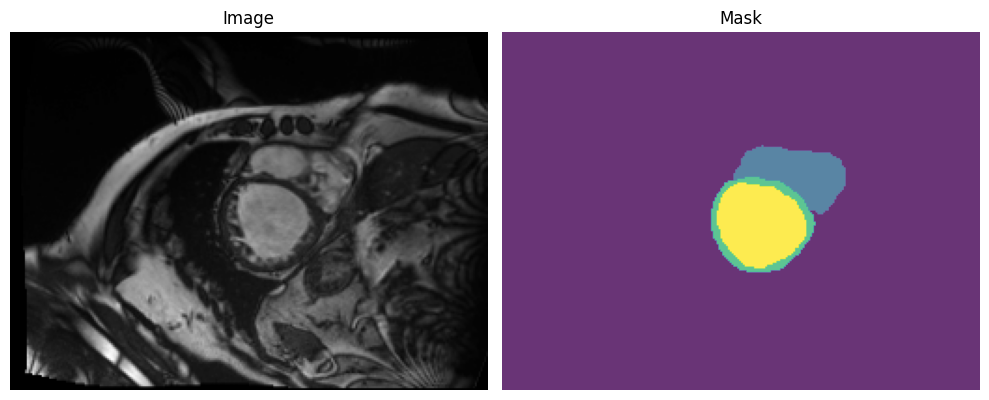

Visualizing a sample from the testing set...
image  (192, 256, 3)


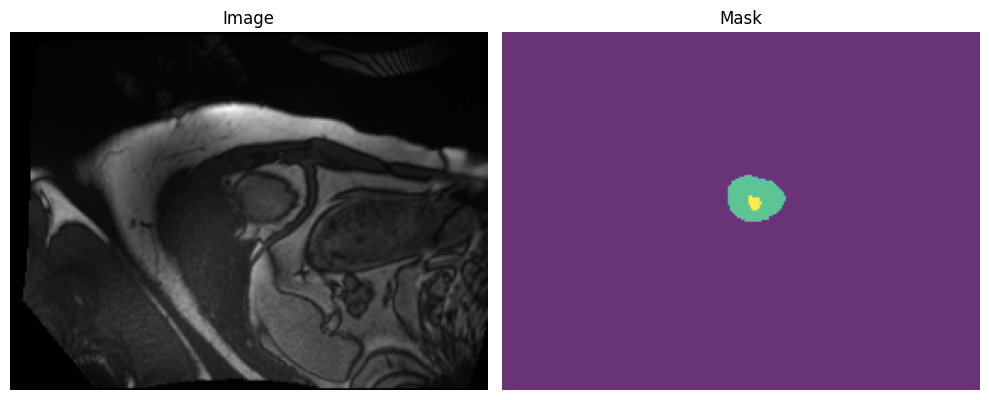

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the save root directory
save_root = '/content/MIS_TransFuse_training/data'

# Helper function to visualize a single sample
def visualize_sample(image_file, mask_file, index=0):
    # Load .npy files
    images = np.load(image_file)
    masks = np.load(mask_file)

    # Check index validity
    if index < 0 or index >= len(images):
        print(f"Index {index} is out of range for the given data.")
        return

    # Extract image and mask
    image = images[index]
    mask = masks[index]

    print("image ", image.shape)

    # Plot the image and mask
    plt.figure(figsize=(10, 5))

    # Display image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Image")
    plt.axis("off")

    # Display mask
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='viridis', alpha=0.8)
    plt.title("Mask")
    plt.axis("off")

    # Show plots
    plt.tight_layout()
    plt.show()

# Paths to the saved .npy files
data_train_file = os.path.join(save_root, 'data_train.npy')
mask_train_file = os.path.join(save_root, 'mask_train.npy')

data_test_file = os.path.join(save_root, 'data_test.npy')
mask_test_file = os.path.join(save_root, 'mask_test.npy')

# Visualize a sample from the training set
print("Visualizing a sample from the training set...")
visualize_sample(data_train_file, mask_train_file, index=5)

# Visualize a sample from the testing set
print("Visualizing a sample from the testing set...")
visualize_sample(data_test_file, mask_test_file, index=10)


## Train Our Data

In [154]:
import torch
import torch.nn.functional as F
import numpy as np
import os, argparse
from lib.TransFuse import TransFuse_S, TransFuse_L, TransFuse_L_384
import imageio


def mean_dice_np(gt, pred, num_classes):
    dice_scores = []
    for c in range(num_classes):
        gt_c = (gt == c)
        pred_c = (pred == c)
        intersection = np.sum(gt_c & pred_c)
        union = np.sum(gt_c) + np.sum(pred_c)
        dice_scores.append(2 * intersection / union if union > 0 else 1.0)
    return np.mean(dice_scores)

def mean_iou_np(gt, pred, num_classes):
    iou_scores = []
    for c in range(num_classes):
        gt_c = (gt == c)
        pred_c = (pred == c)
        intersection = np.sum(gt_c & pred_c)
        union = np.sum(gt_c | pred_c)
        iou_scores.append(intersection / union if union > 0 else 1.0)
    return np.mean(iou_scores)


In [155]:
import torch
import torch.nn as nn
from functools import partial

from timm.data import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from timm.models.helpers import load_pretrained

from timm.models.registry import register_model
from timm.models.layers import DropPath, to_2tuple, trunc_normal_

class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        x = self.drop(x)
        return x

class Attention(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=False, qk_scale=None, attn_drop=0., proj_drop=0.):
        super().__init__()
        self.num_heads = num_heads
        head_dim = dim // num_heads
        # NOTE scale factor was wrong in my original version, can set manually to be compat with prev weights
        self.scale = qk_scale or head_dim ** -0.5

        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]   # make torchscript happy (cannot use tensor as tuple)

        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x

class Block(nn.Module):

    def __init__(self, dim, num_heads, mlp_ratio=4., qkv_bias=False, qk_scale=None, drop=0., attn_drop=0.,
                 drop_path=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm):
        super().__init__()
        self.norm1 = norm_layer(dim)
        self.attn = Attention(
            dim, num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop)
        # NOTE: drop path for stochastic depth, we shall see if this is better than dropout here
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = Mlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)

    def forward(self, x):
        x = x + self.drop_path(self.attn(self.norm1(x)))
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        return x


class PatchEmbed(nn.Module):
    """ Image to Patch Embedding
    """
    def __init__(self, img_size=224, patch_size=16, in_chans=3, embed_dim=768):
        super().__init__()
        img_size = to_2tuple(img_size)
        patch_size = to_2tuple(patch_size)
        num_patches = (img_size[1] // patch_size[1]) * (img_size[0] // patch_size[0])
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = num_patches

        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        B, C, H, W = x.shape

        # FIXME look at relaxing size constraints
        #assert H == self.img_size[0] and W == self.img_size[1], \
        #    f"Input image size ({H}*{W}) doesn't match model ({self.img_size[0]}*{self.img_size[1]})."
        x = self.proj(x).flatten(2).transpose(1, 2)
        return x

class HybridEmbed(nn.Module):
    """ CNN Feature Map Embedding
    """
    def __init__(self, backbone, img_size=224, in_chans=3, embed_dim=768):
        super().__init__()
        self.num_features = embed_dim
        self.backbone = backbone
        self.num_patches = self.backbone.num_features
        self.proj = nn.Linear(self.num_patches, embed_dim)

    def forward(self, x):
        x = self.backbone(x)
        x = x.flatten(2).transpose(1, 2)
        x = self.proj(x)
        return x

class VisionTransformer(nn.Module):
    """ Vision Transformer with support for patch or hybrid CNN input stage
    """
    def __init__(self, img_size=224, patch_size=16, in_chans=3, num_classes=1000, embed_dim=768, depth=12,
                 num_heads=12, mlp_ratio=4., qkv_bias=False, qk_scale=None, drop_rate=0., attn_drop_rate=0.,
                 drop_path_rate=0., hybrid_backbone=None, norm_layer=nn.LayerNorm):
        super().__init__()
        self.num_classes = num_classes
        self.num_features = self.embed_dim = embed_dim  # num_features for consistency with other models

        if hybrid_backbone is not None:
            self.patch_embed = HybridEmbed(
                hybrid_backbone, img_size=img_size, in_chans=in_chans, embed_dim=embed_dim)
        else:
            self.patch_embed = PatchEmbed(
                img_size=img_size, patch_size=patch_size, in_chans=in_chans, embed_dim=embed_dim)
        num_patches = self.patch_embed.num_patches

        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches + 1, embed_dim))
        self.pos_drop = nn.Dropout(p=drop_rate)

        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, depth)]  # stochastic depth decay rule
        self.blocks = nn.ModuleList([
            Block(
                dim=embed_dim, num_heads=num_heads, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, qk_scale=qk_scale,
                drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[i], norm_layer=norm_layer)
            for i in range(depth)])
        self.norm = norm_layer(embed_dim)

        # NOTE as per official impl, we could have a pre-logits representation dense layer + tanh here
        #self.repr = nn.Linear(embed_dim, representation_size)
        #self.repr_act = nn.Tanh()

        # Classifier head
        self.head = nn.Linear(embed_dim, num_classes) if num_classes > 0 else nn.Identity()

        trunc_normal_(self.pos_embed, std=.02)
        trunc_normal_(self.cls_token, std=.02)
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)

    @torch.jit.ignore
    def no_weight_decay(self):
        return {'pos_embed', 'cls_token'}

    def get_classifier(self):
        return self.head

    def reset_classifier(self, num_classes, global_pool=''):
        self.num_classes = num_classes
        self.head = nn.Linear(self.embed_dim, num_classes) if num_classes > 0 else nn.Identity()

    def forward_features(self, x):
        B = x.shape[0]
        x = self.patch_embed(x)

        cls_tokens = self.cls_token.expand(B, -1, -1)  # stole cls_tokens impl from Phil Wang, thanks
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.pos_drop(x)

        for blk in self.blocks:
            x = blk(x)

        x = self.norm(x)
        return x[:, 0]

    def forward(self, x):
        x = self.forward_features(x)
        x = self.head(x)
        return x

In [156]:
import torch
import torch.nn as nn
from functools import partial

from timm.models.registry import register_model
from timm.models.layers import trunc_normal_
import torch.nn.functional as F
import numpy as np


__all__ = [
    'deit_tiny_patch16_224', 'deit_small_patch16_224', 'deit_base_patch16_224',
    'deit_tiny_distilled_patch16_224', 'deit_small_distilled_patch16_224',
    'deit_base_distilled_patch16_224', 'deit_base_patch16_384',
    'deit_base_distilled_patch16_384',
]


class DeiT(VisionTransformer):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        num_patches = self.patch_embed.num_patches
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches + 1, self.embed_dim))

    def forward(self, x):
        # taken from https://github.com/rwightman/pytorch-image-models/blob/master/timm/models/vision_transformer.py
        # with slight modifications to add the dist_token
        x = self.patch_embed(x)
        pe = self.pos_embed

        x = x + pe
        x = self.pos_drop(x)

        for blk in self.blocks:
            x = blk(x)

        x = self.norm(x)
        return x


@register_model
def deit_small_patch16_224(pretrained=False, pretrained_transformer=None, **kwargs):
    model = DeiT(
        patch_size=16, embed_dim=384, depth=8, num_heads=6, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    model.default_cfg = _cfg()
    if pretrained:
        ckpt = torch.load(pretrained_transformer, weights_only=True)
        model.load_state_dict(ckpt['model'], strict=False)

    pe = model.pos_embed[:, 1:, :].detach()
    pe = pe.transpose(-1, -2)
    pe = pe.view(pe.shape[0], pe.shape[1], int(np.sqrt(pe.shape[2])), int(np.sqrt(pe.shape[2])))
    pe = F.interpolate(pe, size=(12, 16), mode='bilinear', align_corners=True)
    pe = pe.flatten(2)
    pe = pe.transpose(-1, -2)
    model.pos_embed = nn.Parameter(pe)
    model.head = nn.Identity()
    return model

<ipython-input-156-ff3f67e153d2>:42: UserWarning: Overwriting deit_small_patch16_224 in registry with __main__.deit_small_patch16_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  def deit_small_patch16_224(pretrained=False, pretrained_transformer=None, **kwargs):


In [157]:
class AvgMeter(object):
    def __init__(self, num=40):
        self.num = num
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
        self.losses = []

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

        # Ensure val is converted to a Tensor before appending
        if not isinstance(val, torch.Tensor):
            val = torch.tensor(val, dtype=torch.float32)
        self.losses.append(val)

    def show(self):
        if len(self.losses) == 0:
            return 0.0  # Return 0 if no losses recorded
        # Safely compute mean for the last 'num' elements
        return torch.mean(torch.stack(self.losses[max(len(self.losses) - self.num, 0):])).item()


In [158]:
import numpy as np
import matplotlib.pyplot as plt
import torch

def visualize_image(image):
    """
    Visualize an image tensor or NumPy array.

    Parameters:
        image (torch.Tensor or np.ndarray): The input image.
                                            Shape: [Batch, Channel, Height, Width] or [Channel, Height, Width].
    """
    print("image bef: ", image.shape)

    if isinstance(image, torch.Tensor):
        image = image.detach().cpu().numpy()  # Convert to NumPy array

    if len(image.shape) == 4:
      image = np.squeeze(image, axis=0)

    print("image aft: ", image.shape)

    if image.shape[0] == 1:  # Single channel (grayscale)
        plt.imshow(image[0], cmap='gray')
    elif image.shape[0] == 3:  # RGB
        plt.imshow(np.transpose(image, (1, 2, 0)))
    else:
        raise ValueError("Image should have 1 or 3 channels for visualization.")

    plt.axis('off')
    plt.show()


def visualize_mask(mask):
    """
    Visualize a segmentation mask tensor or NumPy array.

    Parameters:
        mask (torch.Tensor or np.ndarray): The input mask.
                                           Shape: [Batch, num_classes, Height, Width] or [num_classes, Height, Width].
    """
    print("mask bef: ", mask.shape)

    if isinstance(mask, torch.Tensor):
        mask = image.detach().cpu().numpy()  # Convert to NumPy array

    if len(mask.shape) == 4:
      mask = np.squeeze(mask, axis=0)

    print("mask aft: ", mask.shape)

    # Assume the mask is one-hot encoded; convert to a single-channel class map
    class_map = np.argmax(mask, axis=0)  # Shape: [Height, Width]

    plt.imshow(class_map, cmap='tab10')  # Use a categorical colormap
    plt.colorbar()
    plt.axis('off')
    plt.show()

In [159]:
import torch.utils.data as data
import torchvision.transforms as transforms
import albumentations as A


class MIS_dataset(data.Dataset):
    """
    dataloader for skin lesion segmentation tasks
    """
    def __init__(self, image_root, gt_root, num_classes=5):
        self.images = np.load(image_root)
        self.gts = np.load(gt_root)
        self.size = len(self.images)
        self.num_classes = num_classes

        self.img_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225])
        ])
        self.gt_transform = transforms.Compose([
            transforms.ToTensor()])

        self.transform = A.Compose(
            [
                A.ShiftScaleRotate(shift_limit=0.15, scale_limit=0.15, rotate_limit=25, p=0.5, border_mode=0),
                A.HorizontalFlip(),
                A.VerticalFlip()
            ]
        )

    def one_hot_encode(self, mask):
        """
        Converts a single-channel mask to one-hot encoding with num_classes channels.
        """
        h, w = mask.shape
        one_hot = np.zeros((self.num_classes, h, w), dtype=np.uint8)
        for i in range(self.num_classes):
          one_hot[i] = (mask == i).astype(np.uint8)
        return one_hot

    def __getitem__(self, index):
        image = self.images[index]
        gt = self.gts[index].astype(np.uint8)  # Ensure mask is integer

        # Apply augmentations
        transformed = self.transform(image=image, mask=gt)
        image = transformed['image']
        gt = transformed['mask']

        # Normalize image to [0, 1] if not already
        if image.max() > 1:
            image = (image / 255.0).astype(np.float32)

        # Convert to tensor
        image = torch.from_numpy(image).permute(2, 0, 1).float()  # Channels-first format
        gt = torch.from_numpy(gt.astype(np.uint8))  # Ensure mask is integer

        # Dynamically one-hot encode the mask
        gt_one_hot = self.one_hot_encode(gt.numpy())  # One-hot encode
        gt_one_hot = torch.from_numpy(gt_one_hot)  # Convert to tensor

        return image, gt_one_hot


    def __len__(self):
        return self.size


def get_loader(image_root, gt_root, batchsize, shuffle=True, num_workers=4, pin_memory=True, num_classes=2):

    dataset = MIS_dataset(image_root, gt_root, num_classes=num_classes)
    data_loader = data.DataLoader(dataset=dataset,
                                  batch_size=batchsize,
                                  shuffle=shuffle,
                                  num_workers=num_workers,
                                  pin_memory=pin_memory)
    return data_loader


class test_dataset:
    def __init__(self, image_root, gt_root, num_classes=2, height=192, width=256):
        self.images = np.load(image_root)  # Flattened images
        self.gts = np.load(gt_root)        # Flattened masks
        self.image_shape = (height, width, 3)  # Shape: (H, W, C) for images
        self.mask_shape = (height, width)     # Shape: (H, W) for masks
        self.num_classes = num_classes
        self.size = len(self.images)
        self.index = 0

        # Transformation for images
        self.transform = transforms.Compose([
            transforms.ToTensor(),  # Converts (H, W, C) -> (C, H, W)
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # ImageNet mean/std
        ])

    def load_data(self):
        # Load the current image and mask
        image = self.images[self.index].reshape(self.image_shape)  # Reshape to (192, 256, 3)
        gt = self.gts[self.index].reshape(self.mask_shape).astype(np.uint8)         # Reshape to (192, 256)

        # Normalize image to [0, 1] if not already
        if image.max() > 1:
            image = (image / 255.0).astype(np.float32)

        # Convert to tensor
        image = torch.from_numpy(image).permute(2, 0, 1).float()  # Channels-first format
        image = image.unsqueeze(0) # 1, 3, 192, 256


        # Process the mask
        if self.num_classes > 1:
            # Multi-class: one-hot encode
            gt = torch.tensor(gt, dtype=torch.long)  # Class indices as integers
            gt = torch.nn.functional.one_hot(gt, num_classes=self.num_classes)  # (H, W, num_classes)
            gt = gt.permute(2, 0, 1).float()  # Rearrange to (num_classes, H, W)
            gt = gt.unsqueeze(0)  # (B, num_classes, H, W)
        else:
            # Binary: Normalize to [0, 1]
            gt = torch.tensor(gt, dtype=torch.float32) / 255.0  # (H, W)

        # Increment index for the next image
        self.index += 1

        return image, gt

    def __len__(self):
        return self.size

In [160]:
import torch
from torch.autograd import Variable
import argparse
from datetime import datetime
from lib.TransFuse import TransFuse_S, TransFuse_L, TransFuse_L_384
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import statistics
import os


def structure_loss(pred, mask, num_classes=1):
    if num_classes > 1:
        # Multi-class handling
        if mask.shape[1] == num_classes:
            # Already one-hot encoded
            mask_onehot = mask.float()
        else:
            # Convert to one-hot encoding
            mask = mask.long()
            mask_onehot = F.one_hot(mask, num_classes=num_classes).permute(0, 3, 1, 2).float()

        pred_probs = F.softmax(pred, dim=1)  # Apply softmax to logits for multi-class probabilities

        # Calculate class weights based on mask distribution
        class_counts = mask_onehot.sum(dim=(0, 2, 3))  # Count pixels for each class
        total_pixels = class_counts.sum()
        class_weights = total_pixels / (num_classes * class_counts + 1e-6)  # Inverse frequency weighting
        class_weights /= class_weights.min()  # Normalize to make the smallest weight 1
        class_weights[0] *= 0.05  # Reduce background weight
        class_weights[1] *= 2.00

        # Compute weighted cross-entropy
        weit = 1 + 5 * torch.abs(F.avg_pool2d(mask_onehot, kernel_size=31, stride=1, padding=15) - mask_onehot)
        wce = F.cross_entropy(pred, mask.argmax(dim=1), weight=class_weights, reduction='none')
        wce = (weit * wce.unsqueeze(1)).sum(dim=(2, 3)) / weit.sum(dim=(2, 3))

        # Compute weighted IoU
        inter = ((pred_probs * mask_onehot) * weit).sum(dim=(2, 3))  # Intersection
        union = ((pred_probs + mask_onehot) * weit).sum(dim=(2, 3))  # Union
        wiou = 1 - (inter + 1) / (union - inter + 1)  # Weighted IoU loss

        return (wce + wiou).mean()

    else:
        # Binary handling
        mask = mask.float()
        weit = 1 + 5 * torch.abs(F.avg_pool2d(mask, kernel_size=31, stride=1, padding=15) - mask)

        # Calculate class weight for binary (foreground vs. background)
        total_pixels = mask.numel()
        foreground_pixels = mask.sum()
        background_pixels = total_pixels - foreground_pixels
        class_weights = total_pixels / torch.tensor([background_pixels, foreground_pixels]).to(mask.device)
        class_weights /= class_weights.min()  # Normalize to make the smallest weight 1

        wbce = F.binary_cross_entropy_with_logits(pred, mask, weight=class_weights[1], reduction='none')
        wbce = (weit * wbce).sum(dim=(2, 3)) / weit.sum(dim=(2, 3))

        pred_probs = torch.sigmoid(pred)
        inter = ((pred_probs * mask) * weit).sum(dim=(2, 3))
        union = ((pred_probs + mask) * weit).sum(dim=(2, 3))
        wiou = 1 - (inter + 1) / (union - inter + 1)
        return (wbce + wiou).mean()


def test(model, path, num_classes):
    model.eval()  # Set model to evaluation mode
    mean_loss = []
    mean_dice = []
    mean_iou = []
    mean_acc = []
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    class_weights = torch.tensor([0.1, 1.0, 1.0]).to(device)

    for s in ['val', 'test']:
        image_root = f'{path}/data_{s}.npy'
        gt_root = f'{path}/mask_{s}.npy'
        test_loader = test_dataset(image_root, gt_root, num_classes=num_classes)

        dice_bank = []
        iou_bank = []
        loss_bank = []
        acc_bank = []

        for i in range(test_loader.size):
            image, gt = test_loader.load_data()
            image = image.to(device)
            gt = gt.to(device)

            if gt.ndim == 3:  # Check if gt is missing the batch dimension
                gt = gt.unsqueeze(0)  # Add batch dimension to match res shape

            with torch.no_grad():
                _, _, res = model(image)

            # Handle multi-class vs binary segmentation
            if num_classes > 1:
                res = res.softmax(dim=1)  # Apply softmax for probabilities
                loss = structure_loss(res, gt.long(), num_classes)  # Compute loss
            else:
                res = res.sigmoid()  # Binary sigmoid
                loss = structure_loss(res, gt.float(), num_classes)  # Compute loss

            # Convert tensors to NumPy arrays
            image = image.cpu().numpy().squeeze()
            res = res.cpu().numpy().squeeze()
            gt = gt.cpu().numpy().squeeze()

            if i == 1:
                visualize_image(image)
                visualize_mask(gt)
                visualize_mask(res)

            # Compute metrics
            dice = mean_dice_np(gt, res, num_classes=num_classes)
            iou = mean_iou_np(gt, res, num_classes=num_classes)
            acc = np.mean(res == gt)  # Compute accuracy

            loss_bank.append(loss.item())
            dice_bank.append(dice)
            iou_bank.append(iou)
            acc_bank.append(acc)

        print(f'{s} Loss: {np.mean(loss_bank):.4f}, Dice: {np.mean(dice_bank):.4f}, IoU: {np.mean(iou_bank):.4f}, Acc: {np.mean(acc_bank):.4f}')
        mean_loss.append(np.mean(loss_bank))
        mean_dice.append(np.mean(dice_bank))
        mean_iou.append(np.mean(iou_bank))
        mean_acc.append(np.mean(acc_bank))

    return sum(mean_loss)/len(mean_loss), sum(mean_dice)/len(mean_dice), sum(mean_iou)/len(mean_iou), sum(mean_acc)/len(mean_acc)


def train(train_loader, model, optimizer, epoch, best_loss, no_improve_epoch, num_classes):
    model.train()  # Set model to training mode
    loss_record2, loss_record3, loss_record4 = AvgMeter(), AvgMeter(), AvgMeter()
    accum = 0
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for i, pack in enumerate(train_loader, start=1):
        # ---- Data Preparation ----
        images, gts = pack
        images = images.to(device)
        gts = gts.to(device)

        # ---- Forward Pass ----
        lateral_map_4, lateral_map_3, lateral_map_2 = model(images)

        # ---- Loss Function ----
        loss4 = structure_loss(lateral_map_4, gts, num_classes)
        loss3 = structure_loss(lateral_map_3, gts, num_classes)
        loss2 = structure_loss(lateral_map_2, gts, num_classes)

        # Combined loss with weights
        loss = 0.6 * loss2 + 0.2 * loss3 + 0.2 * loss4

        # ---- Backward and Optimize ----
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), grad_norm)
        optimizer.step()
        optimizer.zero_grad()

        # ---- Record Loss ----
        batch_size = images.size(0)
        loss_record2.update(loss2.item(), batch_size)
        loss_record3.update(loss3.item(), batch_size)
        loss_record4.update(loss4.item(), batch_size)

        # ---- Train Visualization ----
        total_step = len(train_loader)
        if i % 20 == 0 or i == total_step:
            print(f'{datetime.now()} Epoch [{epoch:03d}/{max_epoch:03d}], '
                  f'Step [{i:04d}/{total_step:04d}], '
                  f'[lateral-2: {loss_record2.show():.4f}, '
                  f'lateral-3: {loss_record3.show():.4f}, '
                  f'lateral-4: {loss_record4.show():.4f}]')

    # ---- Save Model if Performance Improves ----
    save_path = f'{model_save_path}/{train_save}/'
    os.makedirs(save_path, exist_ok=True)

    mean_loss, mean_dice, mean_iou, mean_acc = test(model, test_path, num_classes)
    if mean_loss < best_loss:
        print('New best loss:', mean_loss)
        best_loss = mean_loss
        torch.save(model.state_dict(), f'{save_path}TransFuse-S_test_best.pth')
        print('[Saving Snapshot:]', f'{save_path}TransFuse-S_test_best.pth')
        no_improve_epoch = 0
    else:
        no_improve_epoch += 1

    return mean_loss, mean_dice, mean_iou, mean_acc, no_improve_epoch

### Normal Train

In [161]:
# Inputs
max_epoch = 100         # epoch number
stop_epoch = 5          # number of epochs to run when the model doesn't improve
lr = 0.0005               # learning rate
batchsize = 16          # batch size
grad_norm = 2.0         # gradient clipping norm
train_path = '/content/MIS_TransFuse_training/data'        # Path to training dataset
test_path = '/content/MIS_TransFuse_training/data'         # Path to testing dataset
model_save_path = '/content/MIS_TransFuse_training/snapshots'
train_save = 'TransFuse_S'  # Name of training snapshot
beta1 = 0.9             # Adam optimizer beta1
beta2 = 0.999           # Adam optimizer beta2
num_classes = 4          # Number of classes



In [162]:
wandb.init(
    project="MIS_TransFuse_S_training",
    name="TransFuse 2",
    config={
      "max_epoch": 100,           # epoch number
      "stop_epoch": 5,          # number of epochs to run when the model doesn't improve
      "lr": 0.0005,               # learning rate
      "batchsize": 16,          # batch size
      "grad_norm": 2.0,         # gradient clipping norm
      "train_path": '/content/MIS_TransFuse_training/data',        # Path to training dataset
      "test_path": '/content/MIS_TransFuse_training/data',         # Path to testing dataset
      "model_save_path": '/content/MIS_TransFuse_training/snapshots',
      "train_save": 'TransFuse_S',  # Name of training snapshot
      "beta1": 0.9,             # Adam optimizer beta1
      "beta2": 0.999           # Adam optimizer beta2
    })

In [163]:
pretrained_folder_path = "/content/TransFuse-baseline/pretrained"
pretrained_model = os.path.join(pretrained_folder_path, "resnet34-333f7ec4.pth")
pretrained_transformer = os.path.join(pretrained_folder_path, "deit_small_patch16_224-cd65a155.pth")

model = TransFuse_S(num_classes=num_classes, pretrained=True, pretrained_model=pretrained_model, pretrained_transformer=pretrained_transformer).cuda()
params = model.parameters()
optimizer = torch.optim.Adam(params, lr, betas=(beta1, beta2))

image_root = '{}/data_train.npy'.format(train_path)
gt_root = '{}/mask_train.npy'.format(train_path)

train_loader = get_loader(image_root, gt_root, batchsize=batchsize, num_classes=num_classes)
total_step = len(train_loader)

/content/TransFuse-baseline/lib/TransFuse.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.resnet.load_state_dict(torch.load(pretrained_model))
/usr/local/lib/pytho

#################### Start Training ####################
2024-12-10 14:20:06.162110 Epoch [001/100], Step [0020/0102], [lateral-2: 10.1822, lateral-3: 10.6273, lateral-4: 10.4440]
2024-12-10 14:20:12.202320 Epoch [001/100], Step [0040/0102], [lateral-2: 8.5317, lateral-3: 10.1215, lateral-4: 9.1820]
2024-12-10 14:20:18.151175 Epoch [001/100], Step [0060/0102], [lateral-2: 5.7337, lateral-3: 9.4228, lateral-4: 7.1461]
2024-12-10 14:20:24.125329 Epoch [001/100], Step [0080/0102], [lateral-2: 3.9844, lateral-3: 8.9983, lateral-4: 5.9312]
2024-12-10 14:20:30.045611 Epoch [001/100], Step [0100/0102], [lateral-2: 3.2081, lateral-3: 8.6523, lateral-4: 5.3710]
2024-12-10 14:20:30.605085 Epoch [001/100], Step [0102/0102], [lateral-2: 3.2179, lateral-3: 8.6176, lateral-4: 5.3814]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


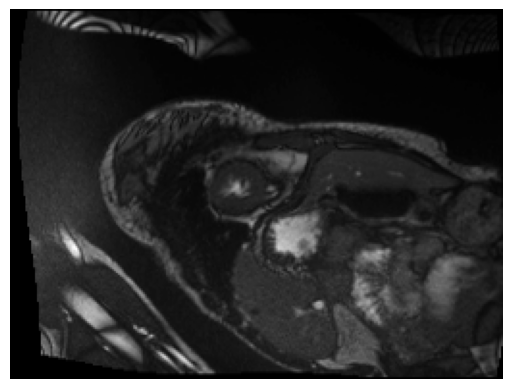

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


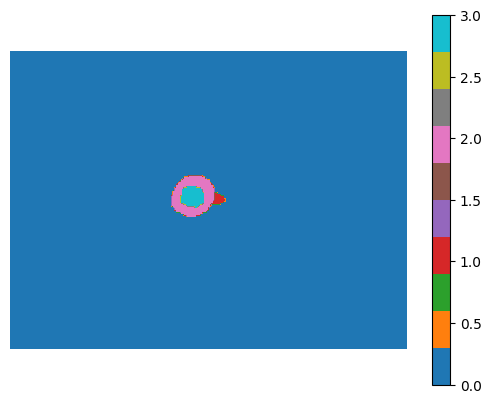

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


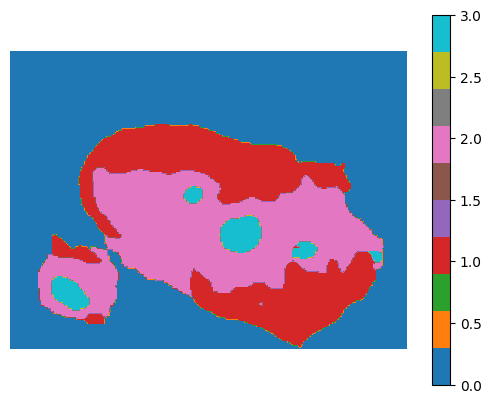

val Loss: 8.4000, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


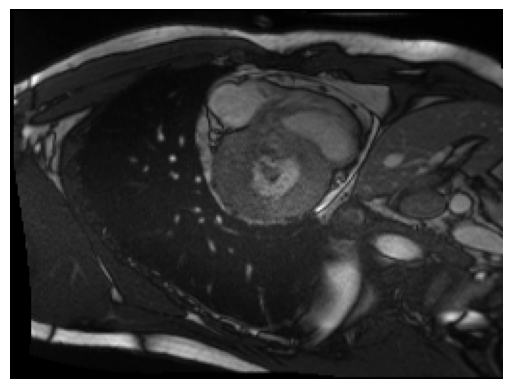

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


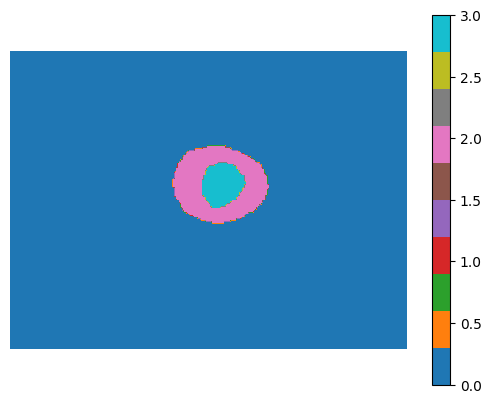

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


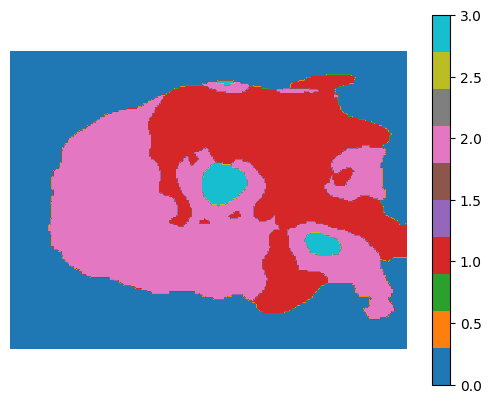

test Loss: 7.8095, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 8.104760410633407
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:21:17.811844 Epoch [002/100], Step [0020/0102], [lateral-2: 2.7255, lateral-3: 7.7414, lateral-4: 4.6375]
2024-12-10 14:21:23.664731 Epoch [002/100], Step [0040/0102], [lateral-2: 2.6812, lateral-3: 7.7097, lateral-4: 4.3951]
2024-12-10 14:21:29.515184 Epoch [002/100], Step [0060/0102], [lateral-2: 2.4520, lateral-3: 7.6301, lateral-4: 4.0405]
2024-12-10 14:21:35.459504 Epoch [002/100], Step [0080/0102], [lateral-2: 2.3089, lateral-3: 7.3993, lateral-4: 3.9766]
2024-12-10 14:21:41.342162 Epoch [002/100], Step [0100/0102], [lateral-2: 2.2776, lateral-3: 7.0772, lateral-4: 4.0207]
2024-12-10 14:21:41.901341 Epoch [002/100], Step [0102/0102], [lateral-2: 2.2763, lateral-3: 7.0474, lateral-4: 4.0226]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


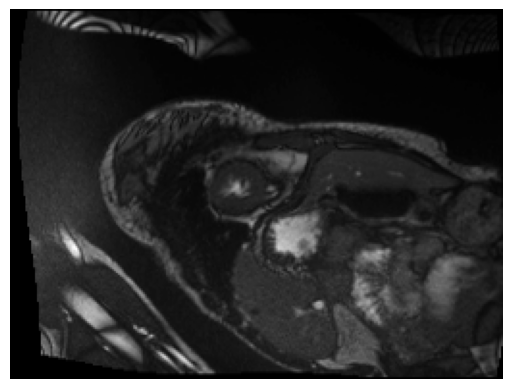

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


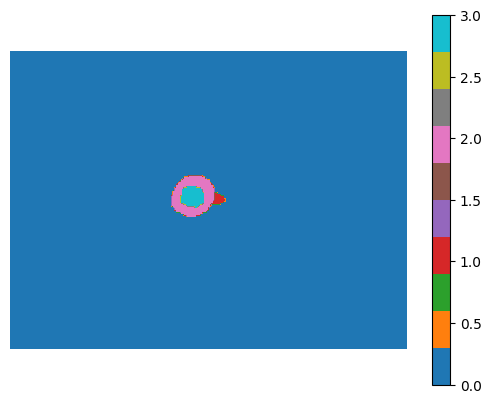

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


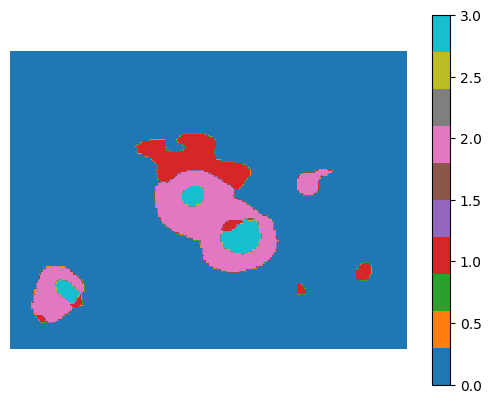

val Loss: 8.0153, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


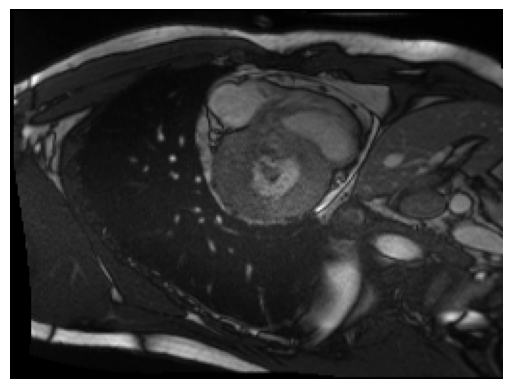

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


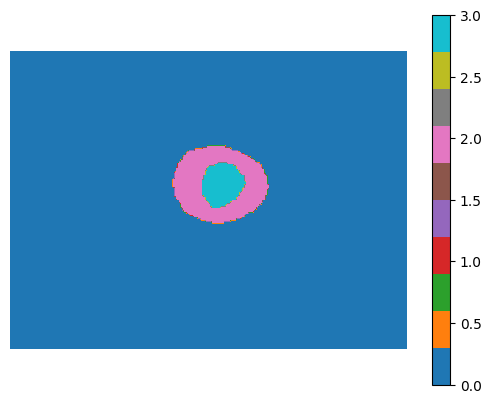

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


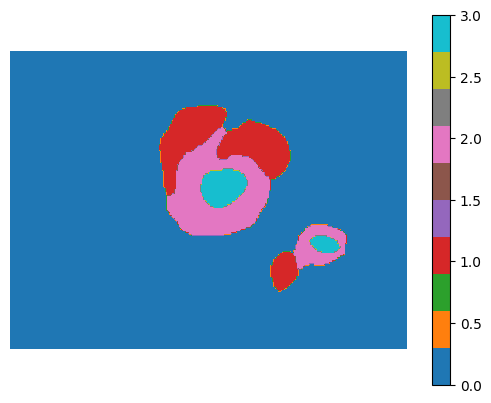

test Loss: 7.4777, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 7.746513500252679
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:22:27.607097 Epoch [003/100], Step [0020/0102], [lateral-2: 1.9357, lateral-3: 6.2773, lateral-4: 3.5599]
2024-12-10 14:22:33.499904 Epoch [003/100], Step [0040/0102], [lateral-2: 1.8733, lateral-3: 6.2526, lateral-4: 3.3433]
2024-12-10 14:22:39.346031 Epoch [003/100], Step [0060/0102], [lateral-2: 1.7988, lateral-3: 6.2236, lateral-4: 3.1466]
2024-12-10 14:22:45.228705 Epoch [003/100], Step [0080/0102], [lateral-2: 1.7381, lateral-3: 6.1342, lateral-4: 3.1526]
2024-12-10 14:22:51.106630 Epoch [003/100], Step [0100/0102], [lateral-2: 1.7706, lateral-3: 6.1478, lateral-4: 3.1155]
2024-12-10 14:22:51.659340 Epoch [003/100], Step [0102/0102], [lateral-2: 1.7701, lateral-3: 6.0791, lateral-4: 3.0777]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


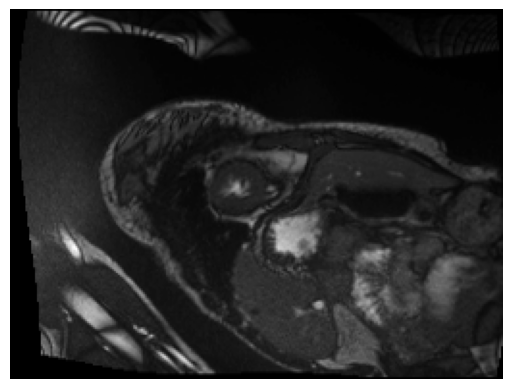

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


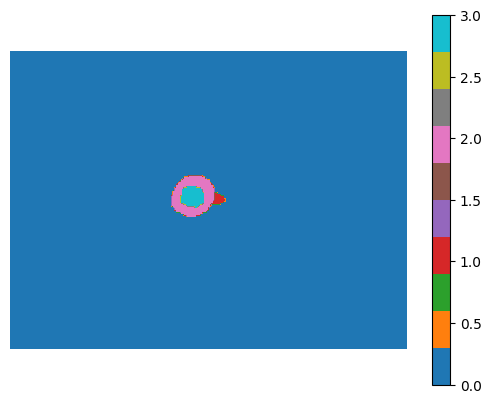

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


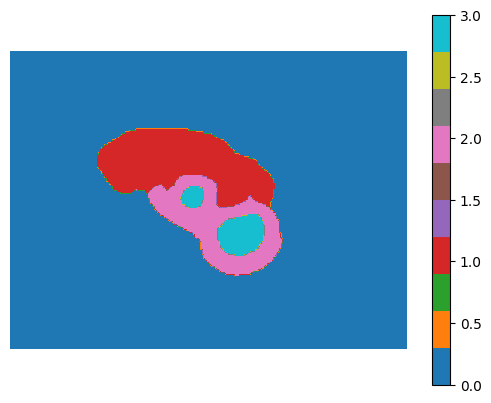

val Loss: 7.7124, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


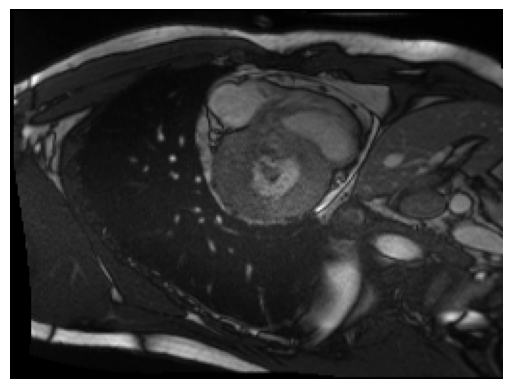

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


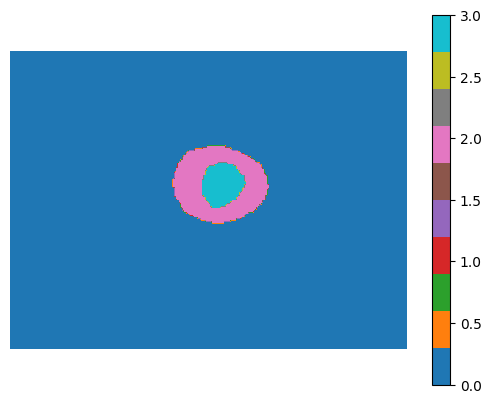

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


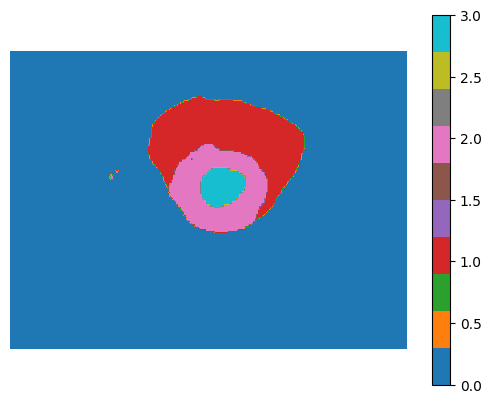

test Loss: 7.1759, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 7.44418289628816
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:23:36.893991 Epoch [004/100], Step [0020/0102], [lateral-2: 1.8513, lateral-3: 5.9180, lateral-4: 3.0653]
2024-12-10 14:23:42.791689 Epoch [004/100], Step [0040/0102], [lateral-2: 1.7624, lateral-3: 5.8655, lateral-4: 3.0225]
2024-12-10 14:23:48.667749 Epoch [004/100], Step [0060/0102], [lateral-2: 1.6660, lateral-3: 5.7083, lateral-4: 2.8961]
2024-12-10 14:23:54.570761 Epoch [004/100], Step [0080/0102], [lateral-2: 1.6477, lateral-3: 5.6430, lateral-4: 2.8314]
2024-12-10 14:24:00.485235 Epoch [004/100], Step [0100/0102], [lateral-2: 1.6437, lateral-3: 5.6557, lateral-4: 2.9081]
2024-12-10 14:24:01.037170 Epoch [004/100], Step [0102/0102], [lateral-2: 1.6284, lateral-3: 5.5945, lateral-4: 2.9072]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


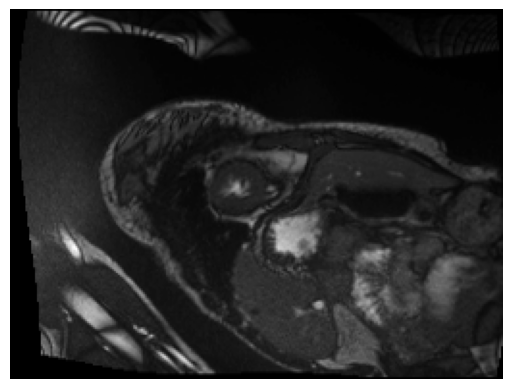

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


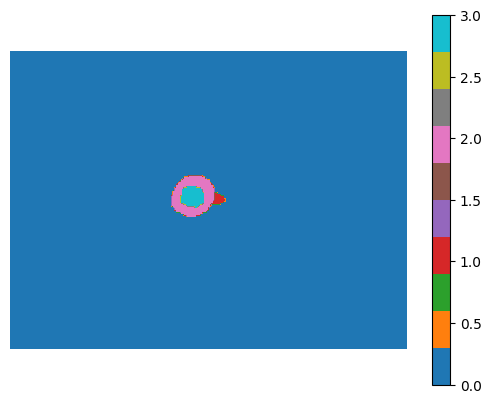

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


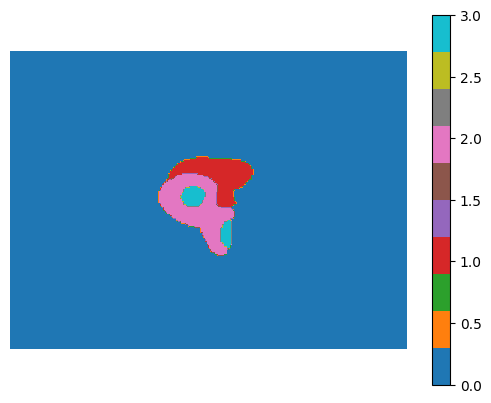

val Loss: 7.7868, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


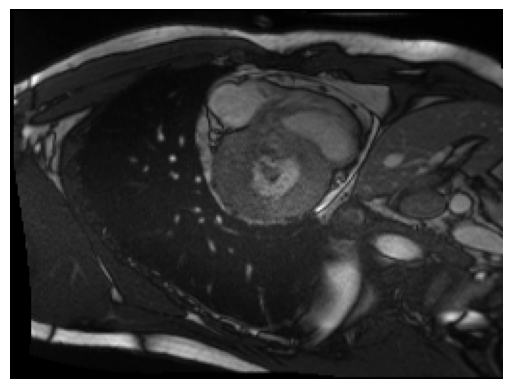

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


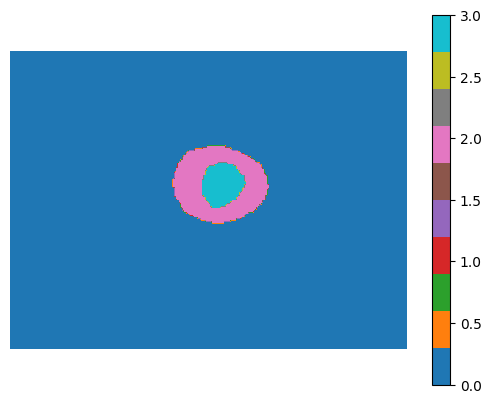

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


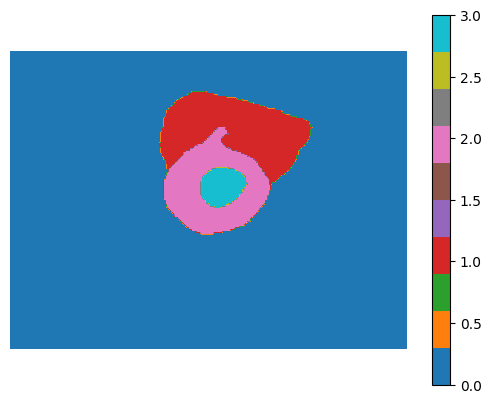

test Loss: 7.1884, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
2024-12-10 14:24:45.617749 Epoch [005/100], Step [0020/0102], [lateral-2: 1.5593, lateral-3: 5.4076, lateral-4: 2.7960]
2024-12-10 14:24:51.503137 Epoch [005/100], Step [0040/0102], [lateral-2: 1.5450, lateral-3: 5.3403, lateral-4: 2.7073]
2024-12-10 14:24:57.463671 Epoch [005/100], Step [0060/0102], [lateral-2: 1.5523, lateral-3: 5.3328, lateral-4: 2.7560]
2024-12-10 14:25:03.408372 Epoch [005/100], Step [0080/0102], [lateral-2: 1.6060, lateral-3: 5.4594, lateral-4: 2.8324]
2024-12-10 14:25:09.308089 Epoch [005/100], Step [0100/0102], [lateral-2: 1.5821, lateral-3: 5.3390, lateral-4: 2.6742]
2024-12-10 14:25:09.867340 Epoch [005/100], Step [0102/0102], [lateral-2: 1.5928, lateral-3: 5.4245, lateral-4: 2.6805]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


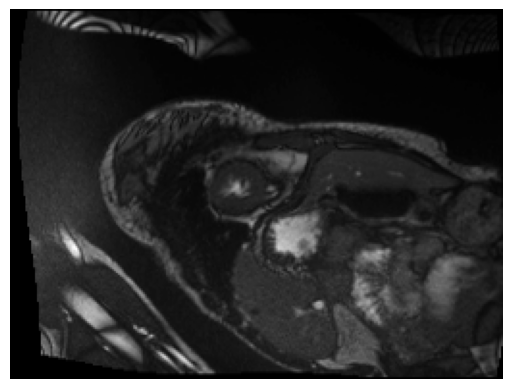

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


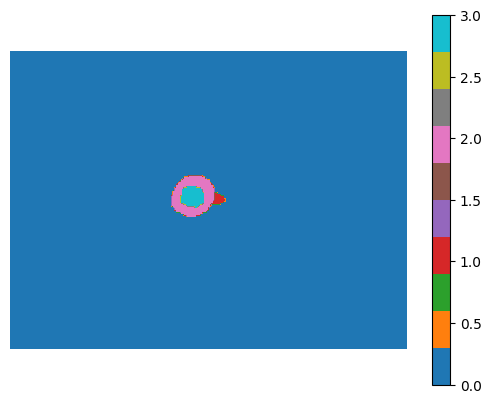

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


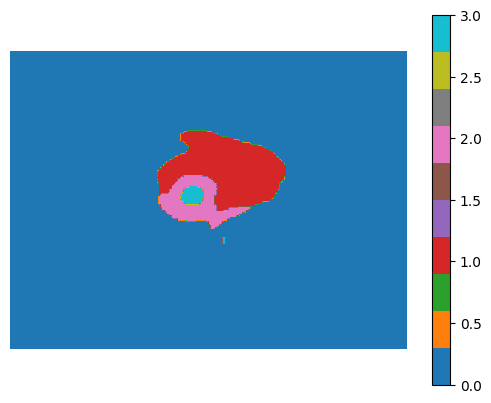

val Loss: 7.7722, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


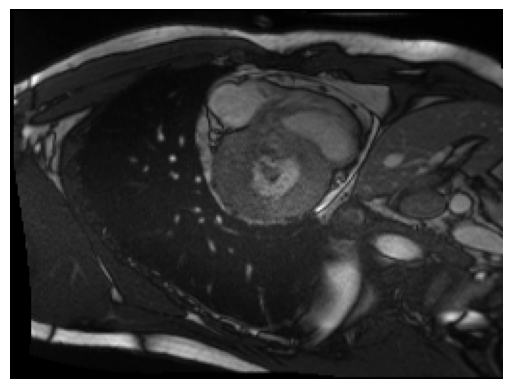

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


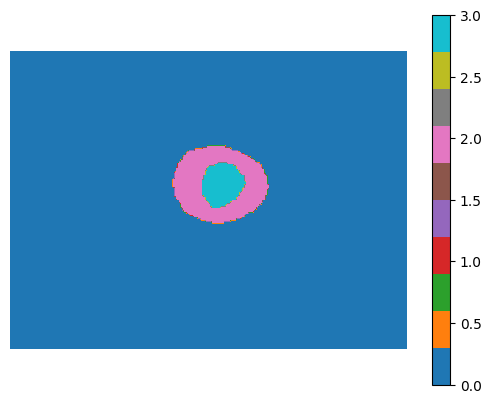

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


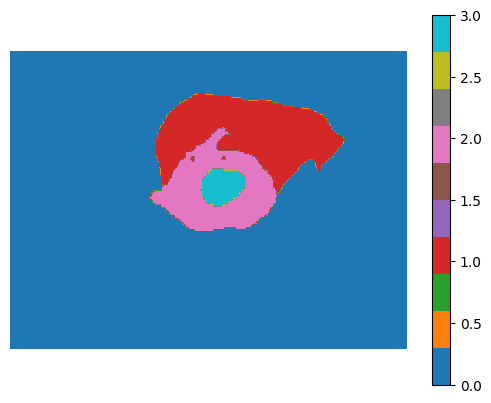

test Loss: 7.1874, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 7.479789059985219
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:26:03.200609 Epoch [006/100], Step [0020/0102], [lateral-2: 1.4257, lateral-3: 5.1368, lateral-4: 2.5107]
2024-12-10 14:26:09.032913 Epoch [006/100], Step [0040/0102], [lateral-2: 1.4425, lateral-3: 5.2775, lateral-4: 2.5463]
2024-12-10 14:26:14.936799 Epoch [006/100], Step [0060/0102], [lateral-2: 1.4381, lateral-3: 5.1301, lateral-4: 2.5216]
2024-12-10 14:26:20.785818 Epoch [006/100], Step [0080/0102], [lateral-2: 1.4056, lateral-3: 4.9990, lateral-4: 2.4339]
2024-12-10 14:26:27.028951 Epoch [006/100], Step [0100/0102], [lateral-2: 1.4686, lateral-3: 4.9509, lateral-4: 2.5489]
2024-12-10 14:26:27.591160 Epoch [006/100], Step [0102/0102], [lateral-2: 1.5025, lateral-3: 4.9627, lateral-4: 2.5746]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


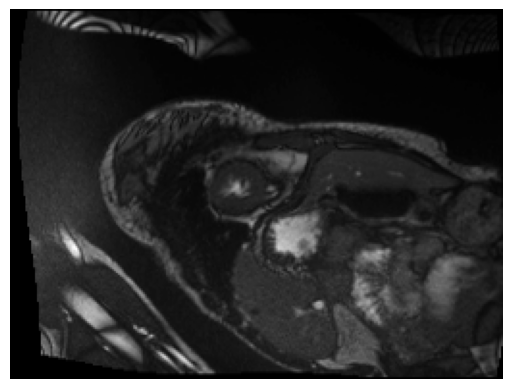

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


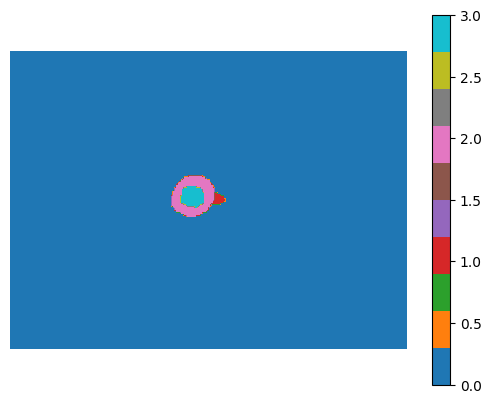

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


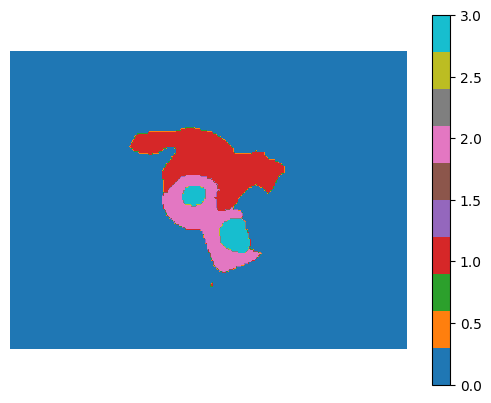

val Loss: 7.6637, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


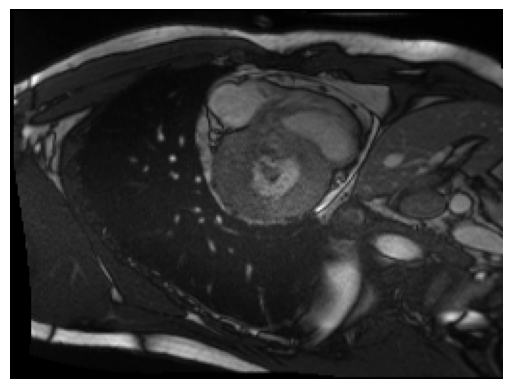

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


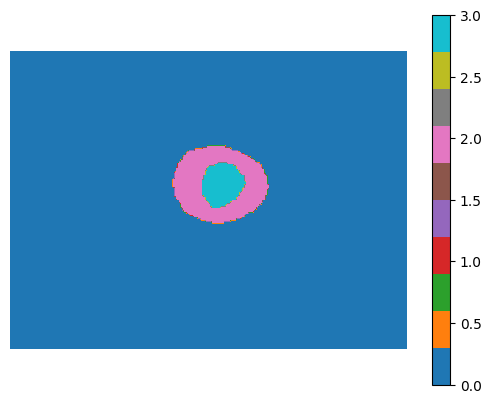

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


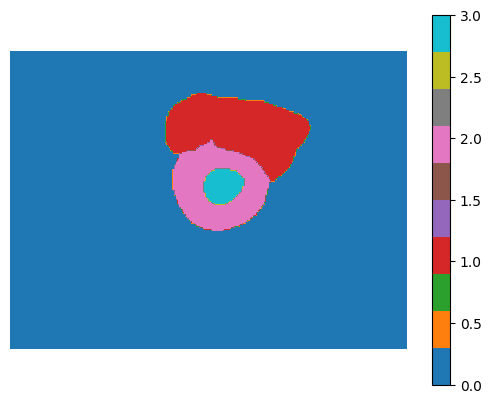

test Loss: 7.1401, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 7.401908493892635
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:27:11.989634 Epoch [007/100], Step [0020/0102], [lateral-2: 1.4675, lateral-3: 4.7969, lateral-4: 2.4566]
2024-12-10 14:27:17.856548 Epoch [007/100], Step [0040/0102], [lateral-2: 1.4327, lateral-3: 4.7900, lateral-4: 2.4631]
2024-12-10 14:27:23.752357 Epoch [007/100], Step [0060/0102], [lateral-2: 1.4065, lateral-3: 4.7986, lateral-4: 2.4586]
2024-12-10 14:27:29.699644 Epoch [007/100], Step [0080/0102], [lateral-2: 1.4777, lateral-3: 4.8671, lateral-4: 2.5192]
2024-12-10 14:27:35.638595 Epoch [007/100], Step [0100/0102], [lateral-2: 1.4366, lateral-3: 4.7773, lateral-4: 2.4546]
2024-12-10 14:27:36.204411 Epoch [007/100], Step [0102/0102], [lateral-2: 1.4291, lateral-3: 4.7605, lateral-4: 2.4262]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


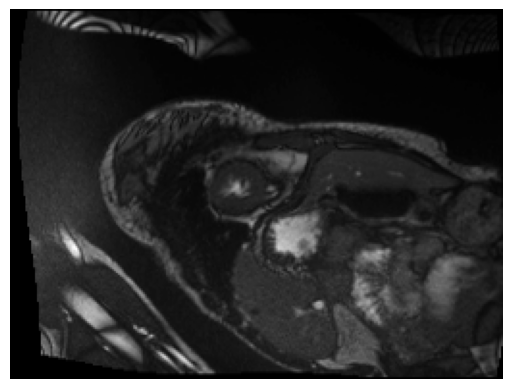

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


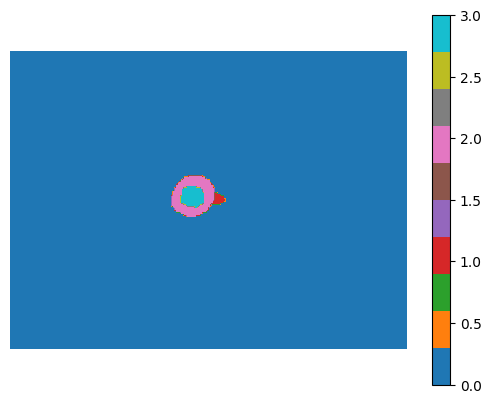

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


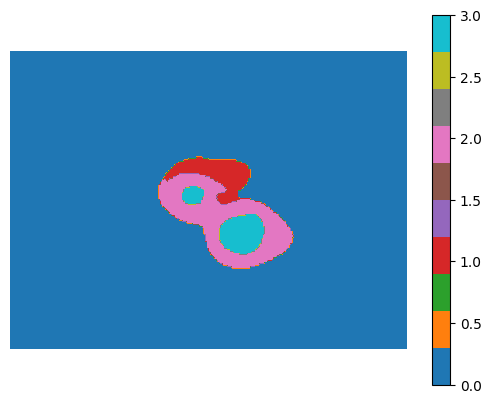

val Loss: 7.8066, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


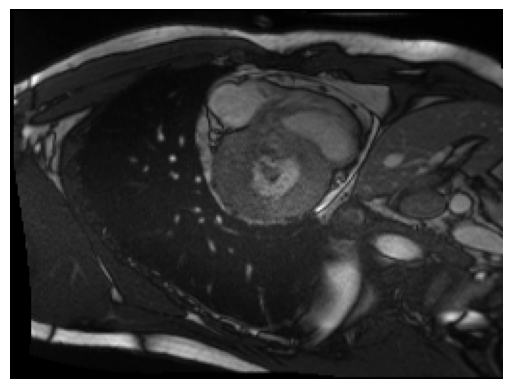

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


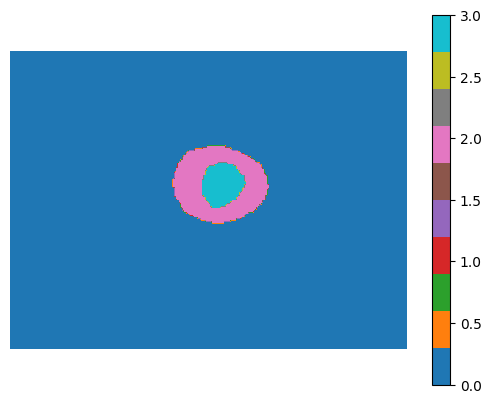

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


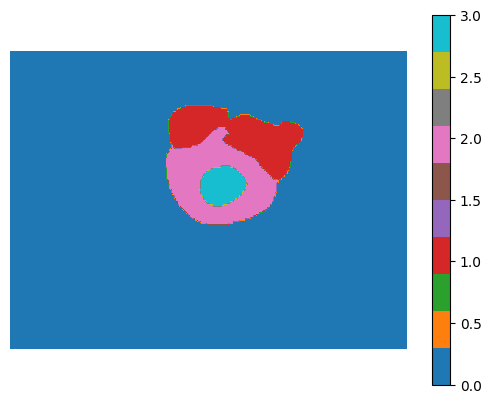

test Loss: 7.2329, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
2024-12-10 14:28:21.139129 Epoch [008/100], Step [0020/0102], [lateral-2: 1.3768, lateral-3: 4.8151, lateral-4: 2.3637]
2024-12-10 14:28:27.212209 Epoch [008/100], Step [0040/0102], [lateral-2: 1.3685, lateral-3: 4.6105, lateral-4: 2.3326]
2024-12-10 14:28:33.274543 Epoch [008/100], Step [0060/0102], [lateral-2: 1.3788, lateral-3: 4.4358, lateral-4: 2.3533]
2024-12-10 14:28:39.421816 Epoch [008/100], Step [0080/0102], [lateral-2: 1.3764, lateral-3: 4.3939, lateral-4: 2.3310]
2024-12-10 14:28:45.512648 Epoch [008/100], Step [0100/0102], [lateral-2: 1.3393, lateral-3: 4.4199, lateral-4: 2.2425]
2024-12-10 14:28:46.089155 Epoch [008/100], Step [0102/0102], [lateral-2: 1.3574, lateral-3: 4.4733, lateral-4: 2.2542]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


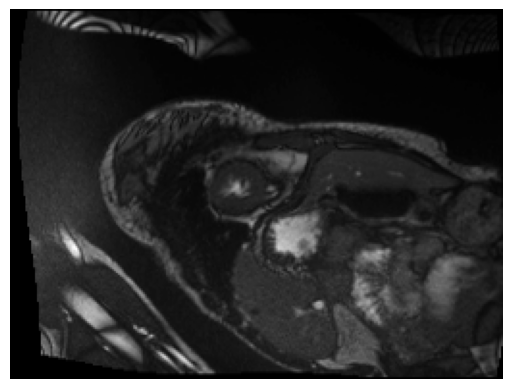

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


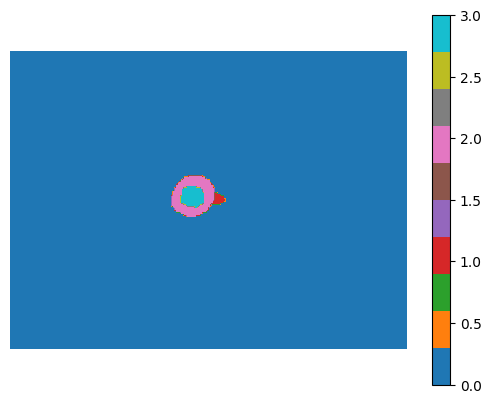

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


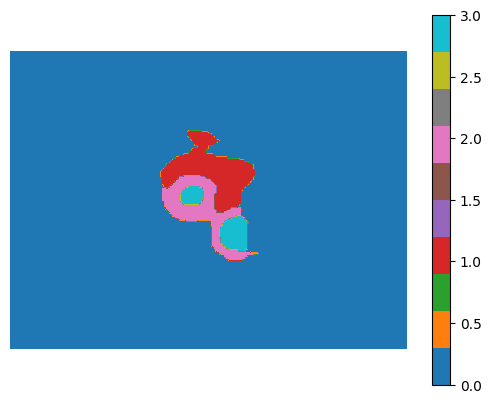

val Loss: 7.4783, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


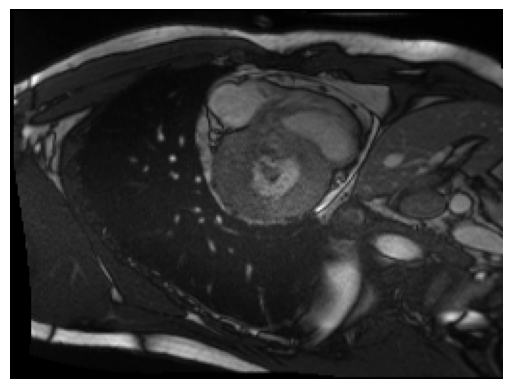

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


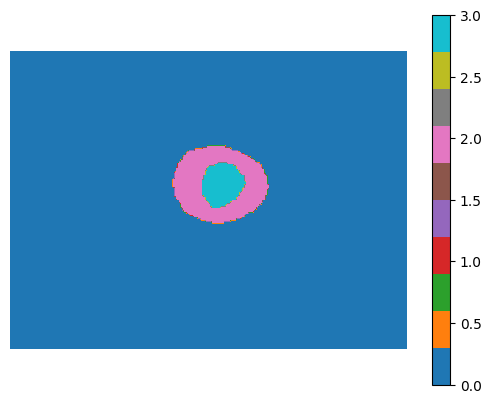

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


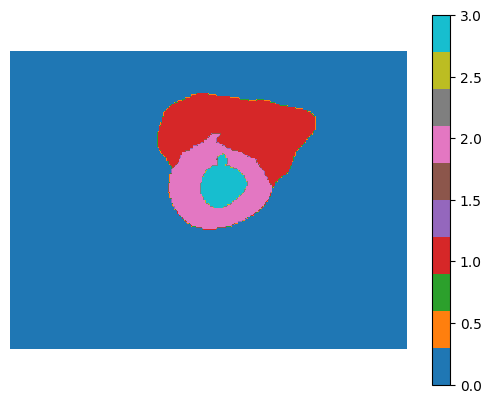

test Loss: 7.0236, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 7.250944836057183
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:29:31.378341 Epoch [009/100], Step [0020/0102], [lateral-2: 1.3245, lateral-3: 4.4518, lateral-4: 2.1612]
2024-12-10 14:29:37.475424 Epoch [009/100], Step [0040/0102], [lateral-2: 1.3298, lateral-3: 4.5116, lateral-4: 2.2065]
2024-12-10 14:29:43.620646 Epoch [009/100], Step [0060/0102], [lateral-2: 1.3194, lateral-3: 4.6595, lateral-4: 2.2595]
2024-12-10 14:29:49.671787 Epoch [009/100], Step [0080/0102], [lateral-2: 1.2845, lateral-3: 4.5703, lateral-4: 2.2253]
2024-12-10 14:29:55.737580 Epoch [009/100], Step [0100/0102], [lateral-2: 1.3290, lateral-3: 4.4640, lateral-4: 2.2504]
2024-12-10 14:29:56.303662 Epoch [009/100], Step [0102/0102], [lateral-2: 1.3203, lateral-3: 4.4360, lateral-4: 2.2432]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


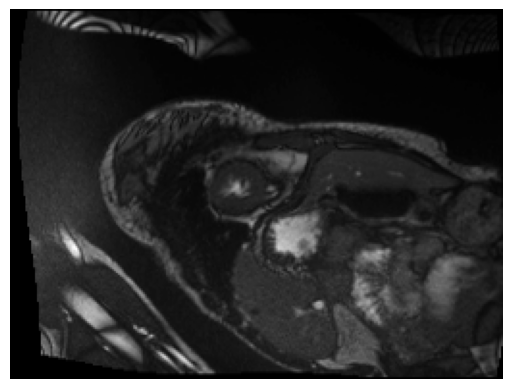

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


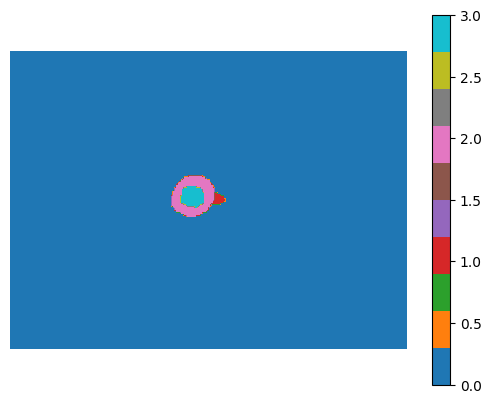

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


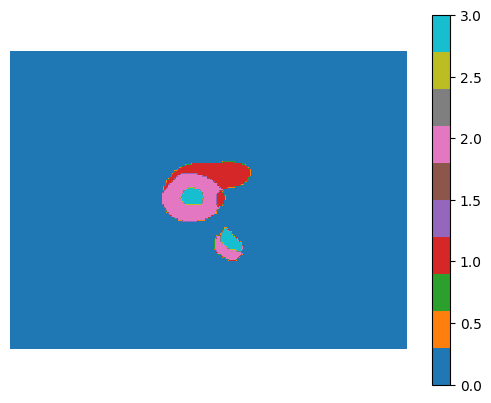

val Loss: 7.6073, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


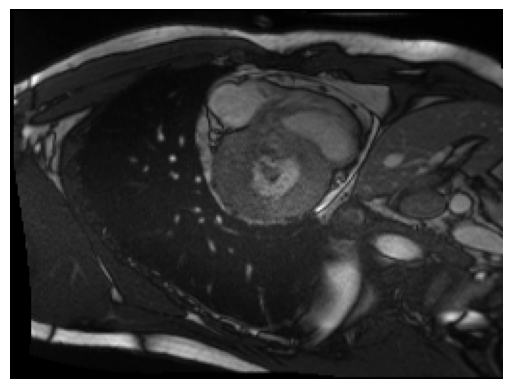

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


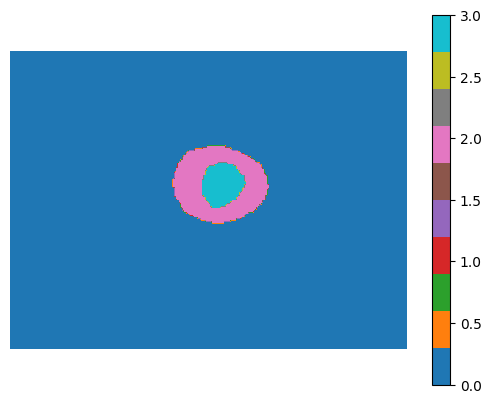

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


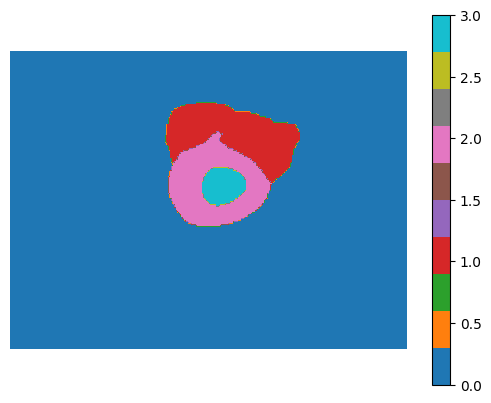

test Loss: 7.1375, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
2024-12-10 14:30:40.133630 Epoch [010/100], Step [0020/0102], [lateral-2: 1.3414, lateral-3: 4.5081, lateral-4: 2.2803]
2024-12-10 14:30:46.072501 Epoch [010/100], Step [0040/0102], [lateral-2: 1.3113, lateral-3: 4.3804, lateral-4: 2.2844]
2024-12-10 14:30:52.029187 Epoch [010/100], Step [0060/0102], [lateral-2: 1.2401, lateral-3: 4.2378, lateral-4: 2.1990]
2024-12-10 14:30:58.038752 Epoch [010/100], Step [0080/0102], [lateral-2: 1.2640, lateral-3: 4.3390, lateral-4: 2.1670]
2024-12-10 14:31:03.965753 Epoch [010/100], Step [0100/0102], [lateral-2: 1.3212, lateral-3: 4.3411, lateral-4: 2.1745]
2024-12-10 14:31:04.524627 Epoch [010/100], Step [0102/0102], [lateral-2: 1.3100, lateral-3: 4.3233, lateral-4: 2.1648]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


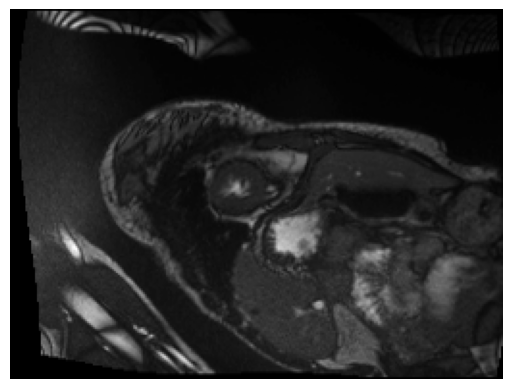

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


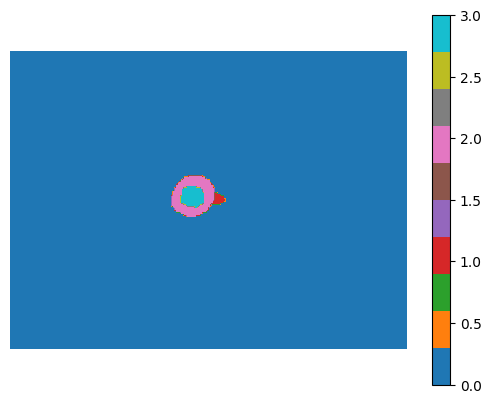

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


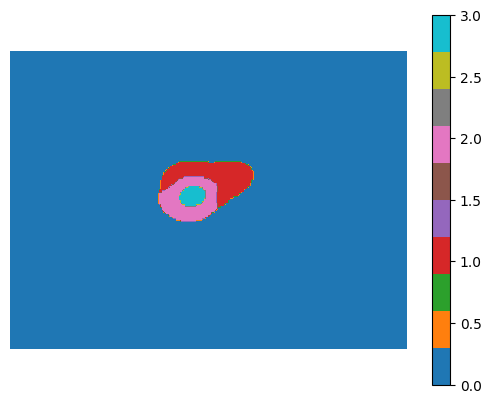

val Loss: 7.5106, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


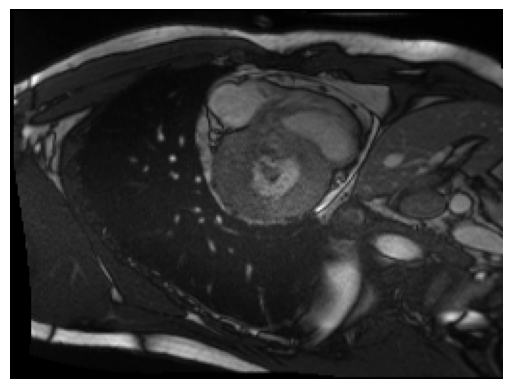

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


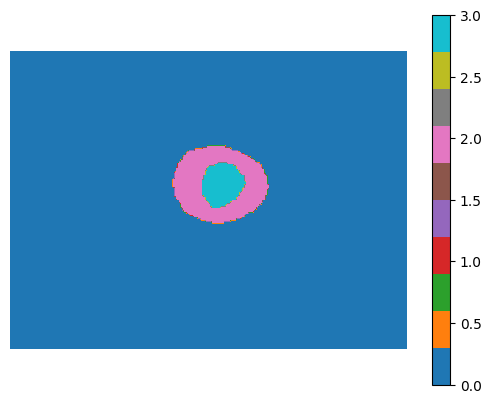

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


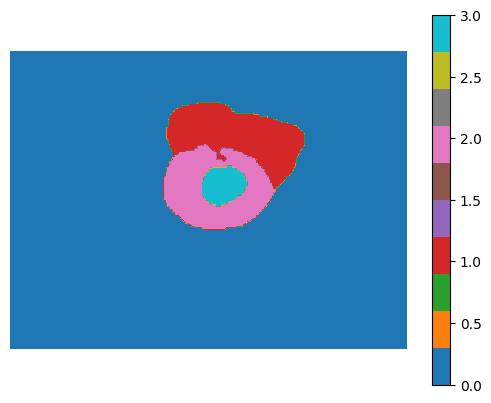

test Loss: 7.0018, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 7.256182501635618
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:31:49.319253 Epoch [011/100], Step [0020/0102], [lateral-2: 1.2382, lateral-3: 3.9029, lateral-4: 2.0013]
2024-12-10 14:31:55.243313 Epoch [011/100], Step [0040/0102], [lateral-2: 1.2228, lateral-3: 4.0540, lateral-4: 1.9922]
2024-12-10 14:32:01.172040 Epoch [011/100], Step [0060/0102], [lateral-2: 1.2004, lateral-3: 4.1261, lateral-4: 2.0211]
2024-12-10 14:32:07.145156 Epoch [011/100], Step [0080/0102], [lateral-2: 1.1972, lateral-3: 4.0148, lateral-4: 1.9976]
2024-12-10 14:32:13.097304 Epoch [011/100], Step [0100/0102], [lateral-2: 1.2156, lateral-3: 3.9804, lateral-4: 2.0273]
2024-12-10 14:32:13.656419 Epoch [011/100], Step [0102/0102], [lateral-2: 1.2175, lateral-3: 3.9848, lateral-4: 2.0431]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


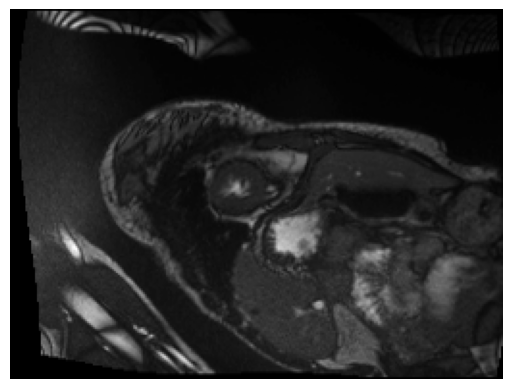

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


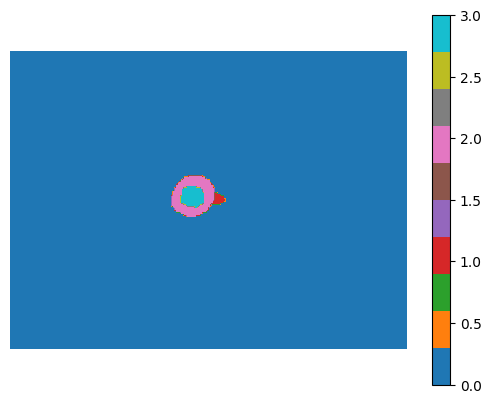

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


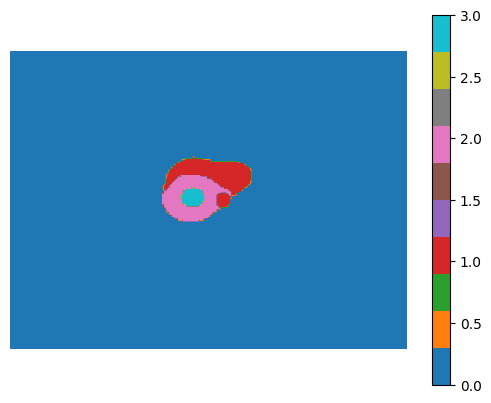

val Loss: 7.4949, Dice: 0.5004, IoU: 0.5002, Acc: 0.0002
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


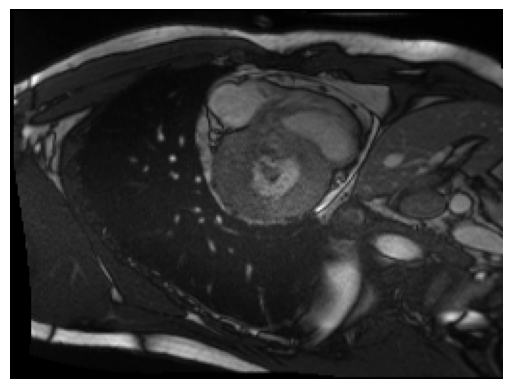

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


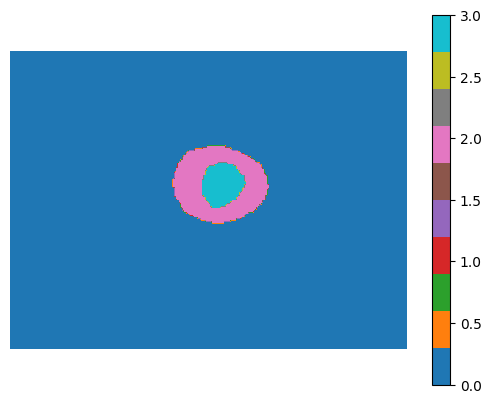

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


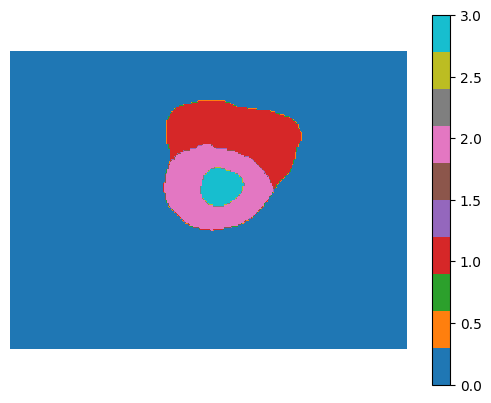

test Loss: 7.0209, Dice: 0.5002, IoU: 0.5001, Acc: 0.0001
2024-12-10 14:32:58.527787 Epoch [012/100], Step [0020/0102], [lateral-2: 1.1880, lateral-3: 4.1615, lateral-4: 2.0430]
2024-12-10 14:33:04.402908 Epoch [012/100], Step [0040/0102], [lateral-2: 1.1766, lateral-3: 4.0165, lateral-4: 2.0213]
2024-12-10 14:33:10.269286 Epoch [012/100], Step [0060/0102], [lateral-2: 1.1458, lateral-3: 3.7616, lateral-4: 1.9632]
2024-12-10 14:33:16.138544 Epoch [012/100], Step [0080/0102], [lateral-2: 1.1519, lateral-3: 3.8603, lateral-4: 1.9482]
2024-12-10 14:33:22.084998 Epoch [012/100], Step [0100/0102], [lateral-2: 1.2324, lateral-3: 4.3201, lateral-4: 2.0585]
2024-12-10 14:33:22.640909 Epoch [012/100], Step [0102/0102], [lateral-2: 1.2305, lateral-3: 4.3351, lateral-4: 2.0549]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


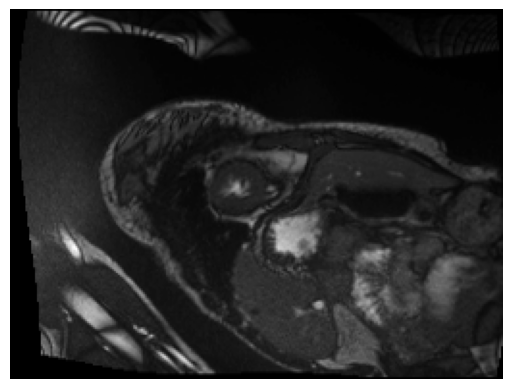

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


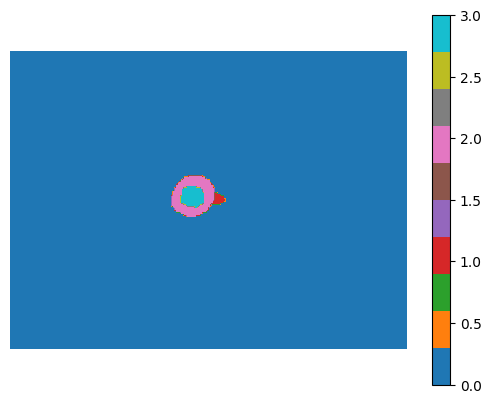

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


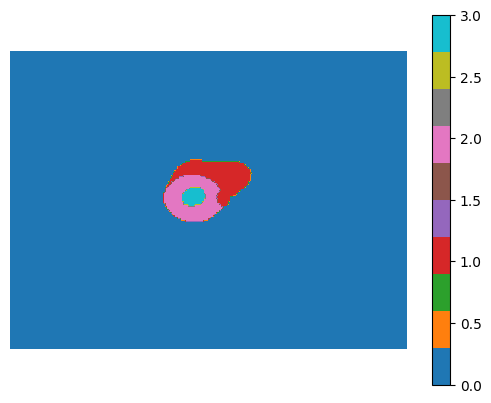

val Loss: 7.4820, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


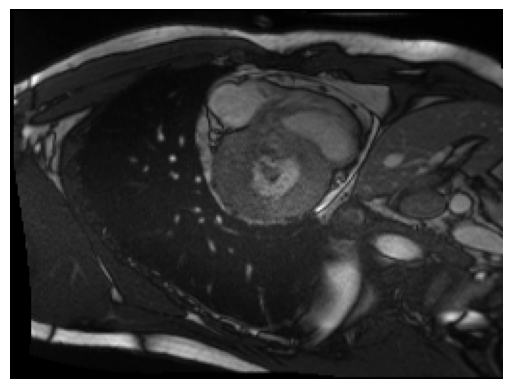

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


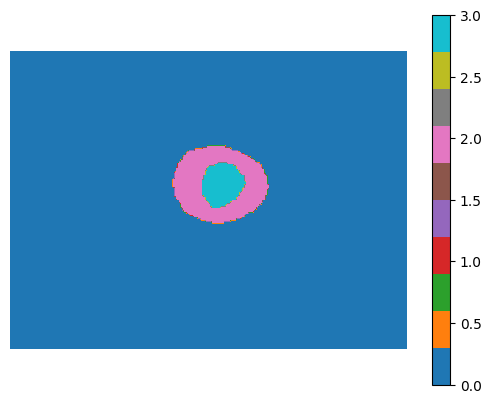

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


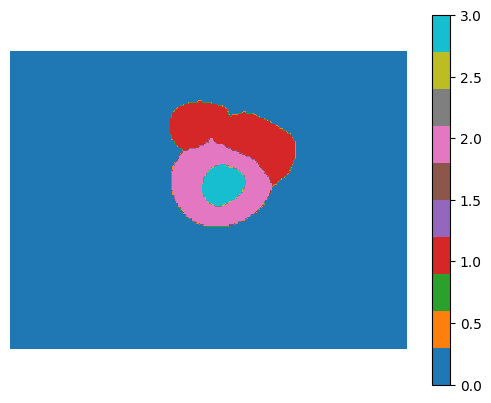

test Loss: 7.0313, Dice: 0.5000, IoU: 0.5000, Acc: 0.0000
New best loss: 7.2566661959482595
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:34:07.497629 Epoch [013/100], Step [0020/0102], [lateral-2: 1.1953, lateral-3: 4.0766, lateral-4: 2.0788]
2024-12-10 14:34:13.328612 Epoch [013/100], Step [0040/0102], [lateral-2: 1.2169, lateral-3: 3.9935, lateral-4: 2.1011]
2024-12-10 14:34:19.209004 Epoch [013/100], Step [0060/0102], [lateral-2: 1.2252, lateral-3: 3.9179, lateral-4: 2.0719]
2024-12-10 14:34:25.089990 Epoch [013/100], Step [0080/0102], [lateral-2: 1.1951, lateral-3: 3.8182, lateral-4: 1.9797]
2024-12-10 14:34:30.944432 Epoch [013/100], Step [0100/0102], [lateral-2: 1.1660, lateral-3: 3.7553, lateral-4: 1.9455]
2024-12-10 14:34:31.500358 Epoch [013/100], Step [0102/0102], [lateral-2: 1.1696, lateral-3: 3.7517, lateral-4: 1.9494]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


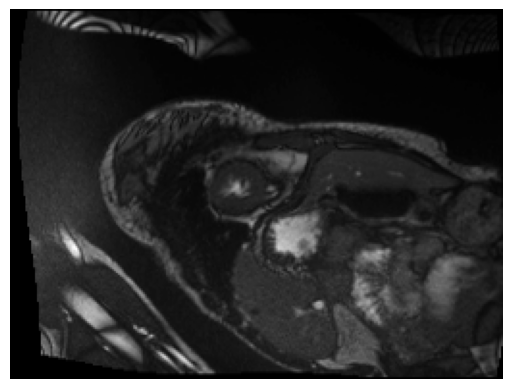

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


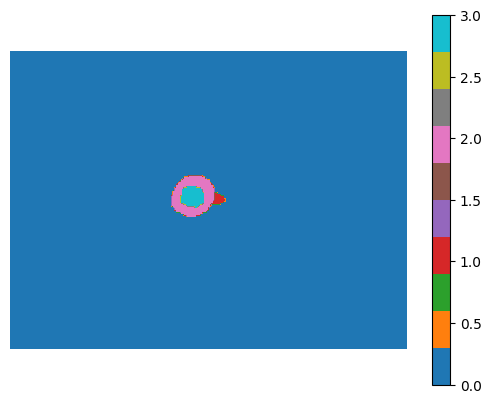

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


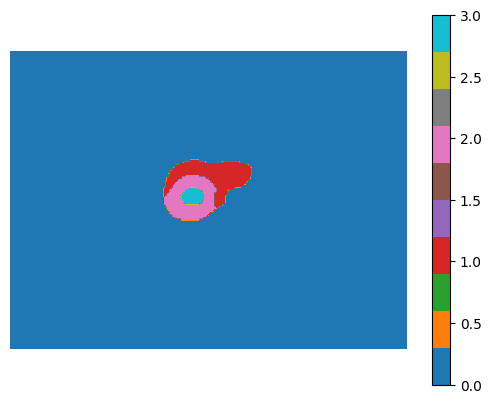

val Loss: 7.5112, Dice: 0.5001, IoU: 0.5000, Acc: 0.0000
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


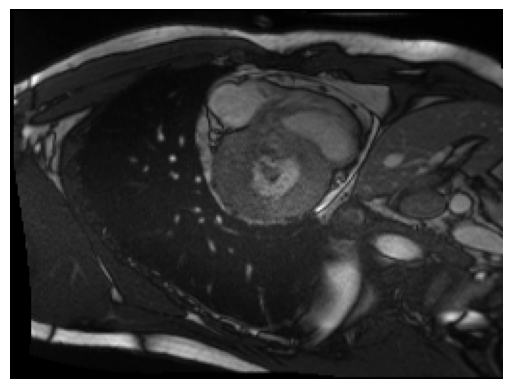

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


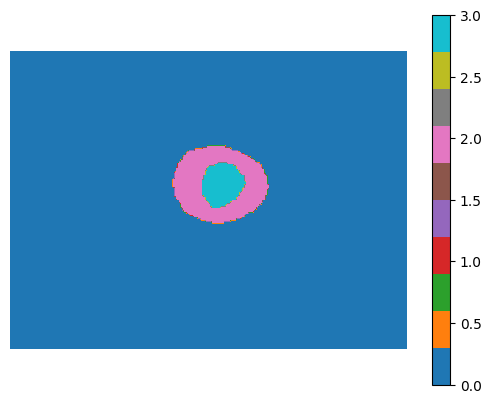

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


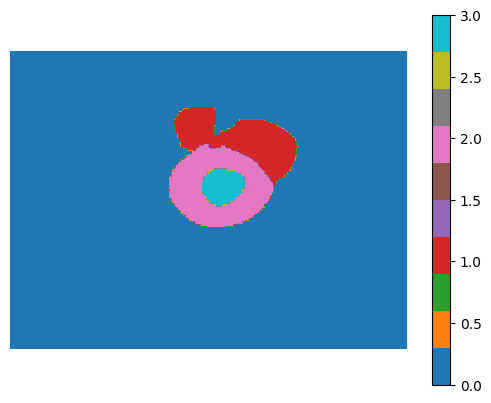

test Loss: 7.1323, Dice: 0.5001, IoU: 0.5000, Acc: 0.0000
2024-12-10 14:35:17.424767 Epoch [014/100], Step [0020/0102], [lateral-2: 1.1879, lateral-3: 3.9012, lateral-4: 2.0284]
2024-12-10 14:35:23.318181 Epoch [014/100], Step [0040/0102], [lateral-2: 1.1583, lateral-3: 3.8284, lateral-4: 1.9702]
2024-12-10 14:35:29.175395 Epoch [014/100], Step [0060/0102], [lateral-2: 1.1691, lateral-3: 3.7212, lateral-4: 1.9503]
2024-12-10 14:35:35.098430 Epoch [014/100], Step [0080/0102], [lateral-2: 1.1864, lateral-3: 3.6288, lateral-4: 1.9462]
2024-12-10 14:35:40.959992 Epoch [014/100], Step [0100/0102], [lateral-2: 1.1502, lateral-3: 3.5938, lateral-4: 1.9096]
2024-12-10 14:35:41.516912 Epoch [014/100], Step [0102/0102], [lateral-2: 1.1517, lateral-3: 3.6283, lateral-4: 1.9039]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


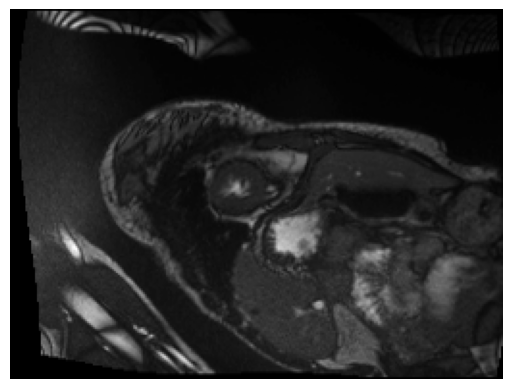

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


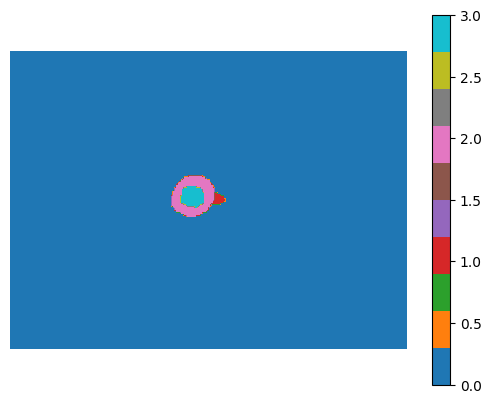

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


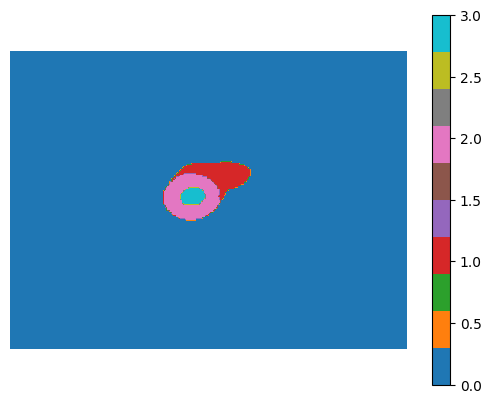

val Loss: 7.5918, Dice: 0.5034, IoU: 0.5017, Acc: 0.0017
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


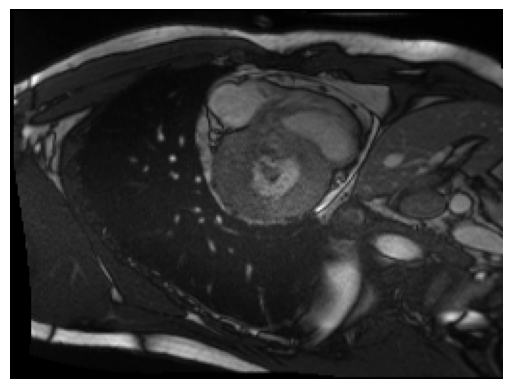

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


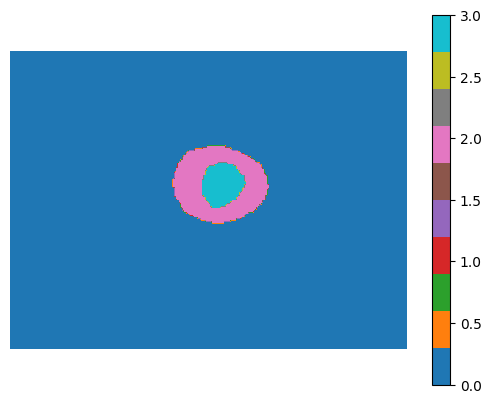

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


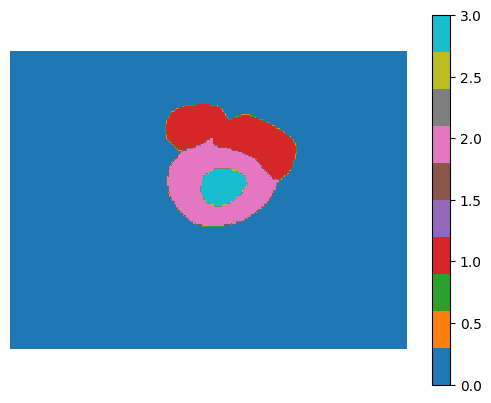

test Loss: 7.0506, Dice: 0.5029, IoU: 0.5015, Acc: 0.0015
New best loss: 7.321159037864076
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:36:26.851743 Epoch [015/100], Step [0020/0102], [lateral-2: 1.1579, lateral-3: 3.8932, lateral-4: 2.0136]
2024-12-10 14:36:32.776907 Epoch [015/100], Step [0040/0102], [lateral-2: 1.1200, lateral-3: 3.6930, lateral-4: 1.9319]
2024-12-10 14:36:38.671437 Epoch [015/100], Step [0060/0102], [lateral-2: 1.1319, lateral-3: 3.8003, lateral-4: 1.9036]
2024-12-10 14:36:44.589489 Epoch [015/100], Step [0080/0102], [lateral-2: 1.1543, lateral-3: 3.8190, lateral-4: 1.9301]
2024-12-10 14:36:50.565940 Epoch [015/100], Step [0100/0102], [lateral-2: 1.1220, lateral-3: 3.5892, lateral-4: 1.8787]
2024-12-10 14:36:51.128273 Epoch [015/100], Step [0102/0102], [lateral-2: 1.1258, lateral-3: 3.5912, lateral-4: 1.8799]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


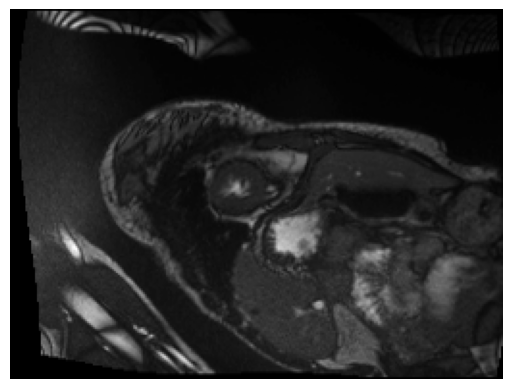

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


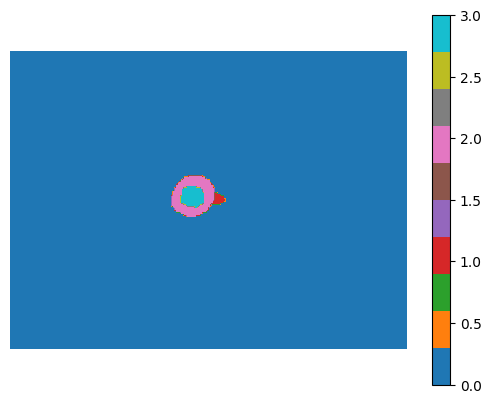

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


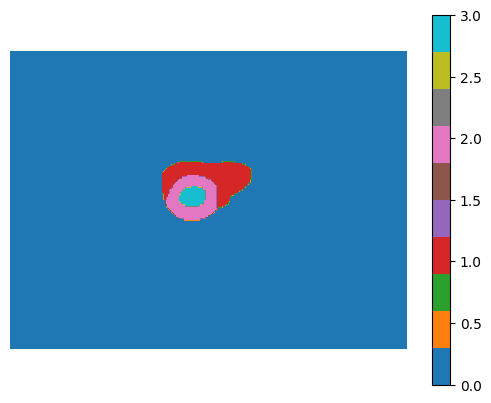

val Loss: 7.4216, Dice: 0.5036, IoU: 0.5018, Acc: 0.0018
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


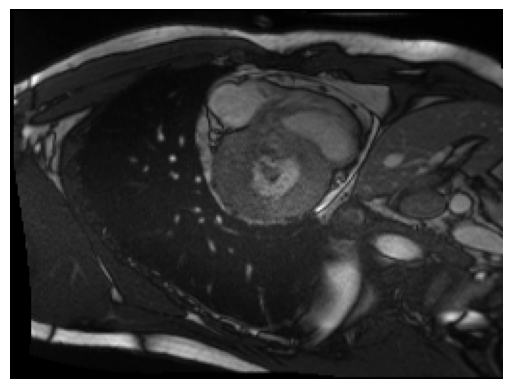

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


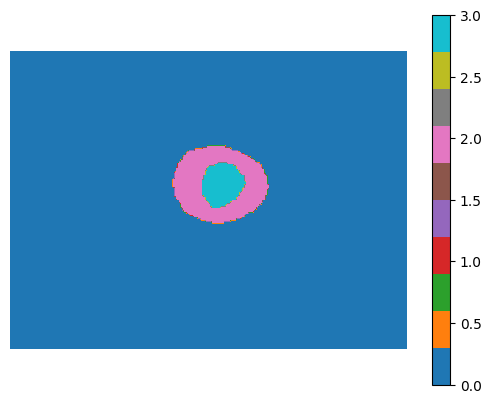

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


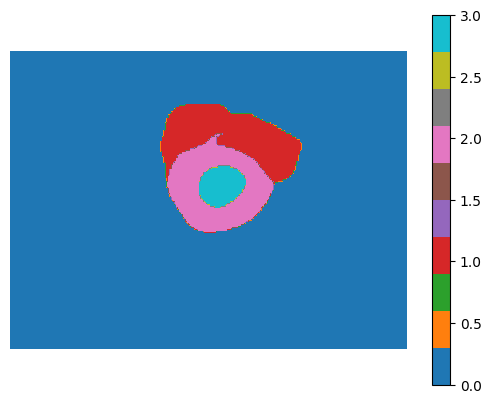

test Loss: 6.9491, Dice: 0.5056, IoU: 0.5029, Acc: 0.0029
New best loss: 7.185316349501274
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:37:36.107991 Epoch [016/100], Step [0020/0102], [lateral-2: 1.2088, lateral-3: 3.8580, lateral-4: 1.9973]
2024-12-10 14:37:41.940049 Epoch [016/100], Step [0040/0102], [lateral-2: 1.2247, lateral-3: 3.7449, lateral-4: 1.9898]
2024-12-10 14:37:47.831303 Epoch [016/100], Step [0060/0102], [lateral-2: 1.2027, lateral-3: 3.6603, lateral-4: 1.9642]
2024-12-10 14:37:53.693115 Epoch [016/100], Step [0080/0102], [lateral-2: 1.1497, lateral-3: 3.6238, lateral-4: 1.9160]
2024-12-10 14:37:59.556757 Epoch [016/100], Step [0100/0102], [lateral-2: 1.1167, lateral-3: 3.5661, lateral-4: 1.8653]
2024-12-10 14:38:00.112961 Epoch [016/100], Step [0102/0102], [lateral-2: 1.1188, lateral-3: 3.5591, lateral-4: 1.8623]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


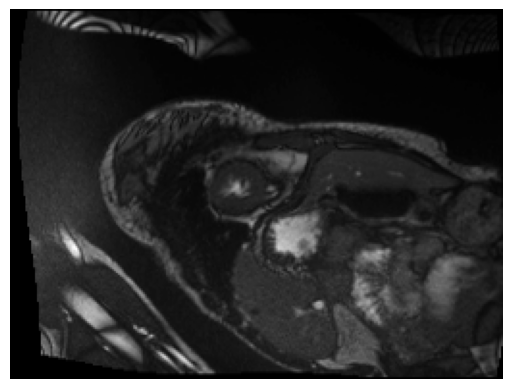

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


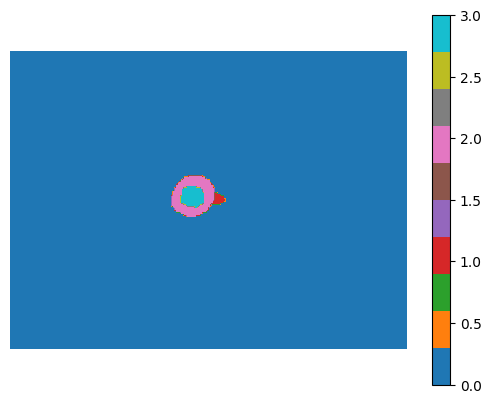

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


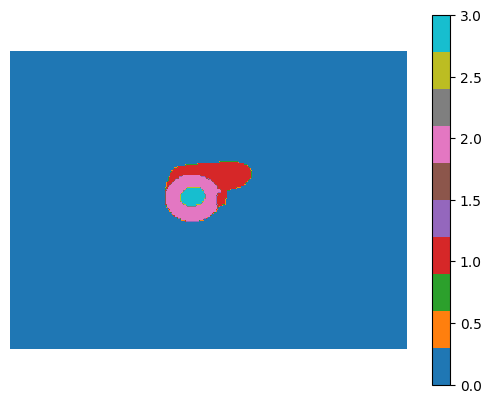

val Loss: 7.4974, Dice: 0.5037, IoU: 0.5019, Acc: 0.0019
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


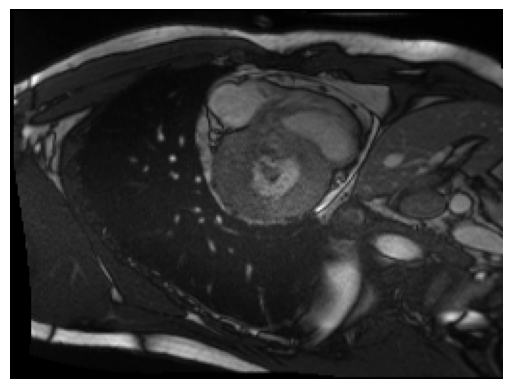

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


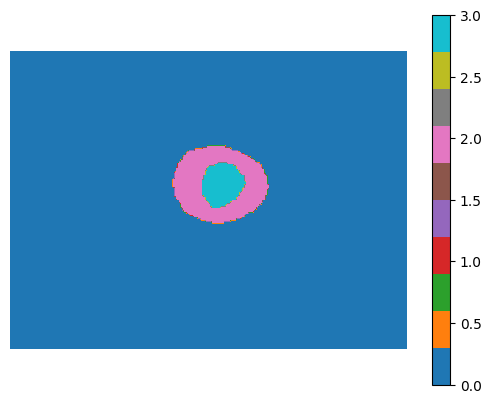

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


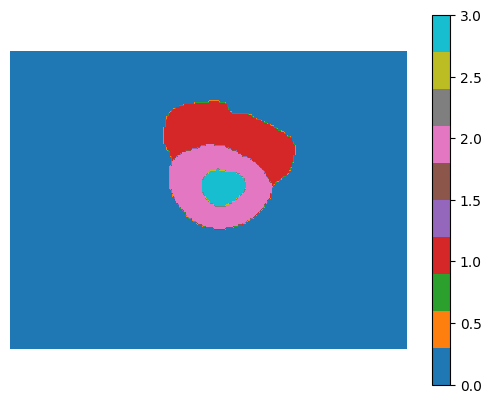

test Loss: 6.9936, Dice: 0.5045, IoU: 0.5023, Acc: 0.0023
2024-12-10 14:38:44.803879 Epoch [017/100], Step [0020/0102], [lateral-2: 1.1544, lateral-3: 3.6531, lateral-4: 1.8686]
2024-12-10 14:38:50.642094 Epoch [017/100], Step [0040/0102], [lateral-2: 1.1353, lateral-3: 3.5588, lateral-4: 1.8866]
2024-12-10 14:38:56.459647 Epoch [017/100], Step [0060/0102], [lateral-2: 1.1514, lateral-3: 3.3636, lateral-4: 1.8871]
2024-12-10 14:39:02.384898 Epoch [017/100], Step [0080/0102], [lateral-2: 1.1926, lateral-3: 3.4570, lateral-4: 1.9313]
2024-12-10 14:39:08.227489 Epoch [017/100], Step [0100/0102], [lateral-2: 1.1653, lateral-3: 3.5638, lateral-4: 1.9118]
2024-12-10 14:39:08.780832 Epoch [017/100], Step [0102/0102], [lateral-2: 1.1770, lateral-3: 3.6150, lateral-4: 1.9362]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


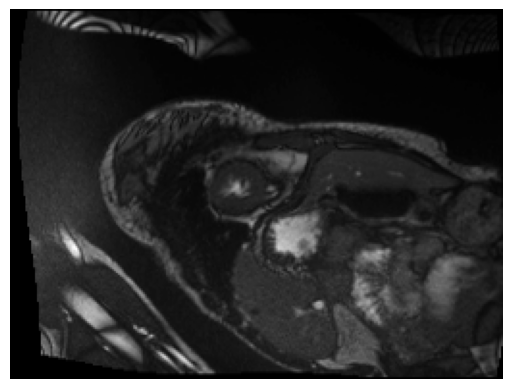

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


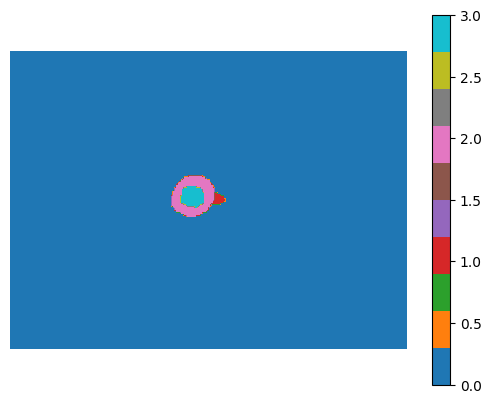

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


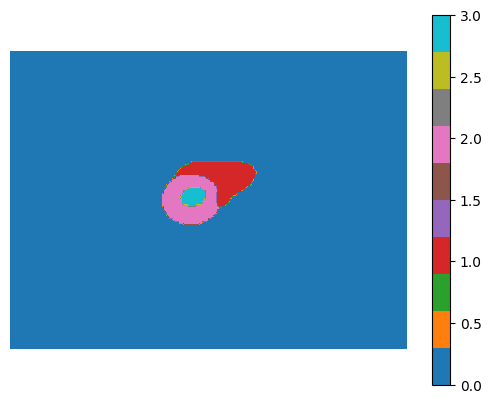

val Loss: 7.4773, Dice: 0.5065, IoU: 0.5033, Acc: 0.0033
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


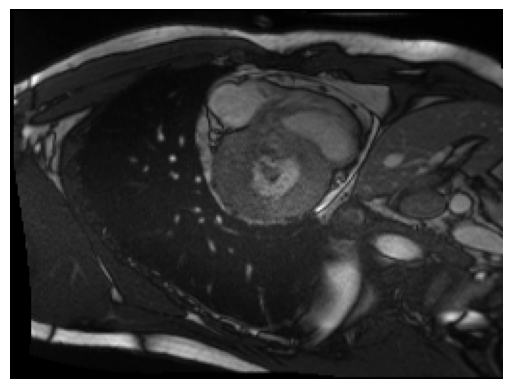

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


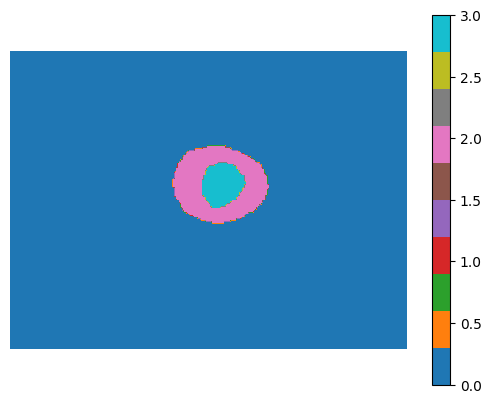

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


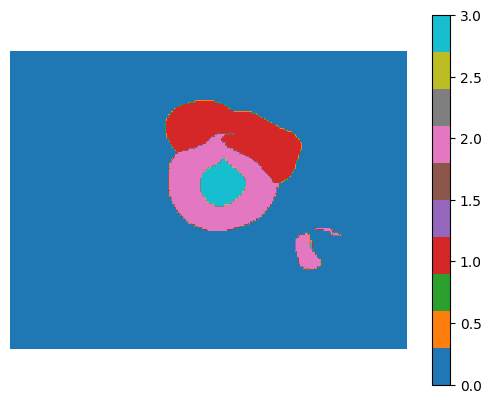

test Loss: 7.0083, Dice: 0.5075, IoU: 0.5039, Acc: 0.0039
New best loss: 7.242803991242675
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:39:53.455902 Epoch [018/100], Step [0020/0102], [lateral-2: 1.1253, lateral-3: 3.3475, lateral-4: 1.8481]
2024-12-10 14:39:59.360666 Epoch [018/100], Step [0040/0102], [lateral-2: 1.1282, lateral-3: 3.4545, lateral-4: 1.8957]
2024-12-10 14:40:05.206742 Epoch [018/100], Step [0060/0102], [lateral-2: 1.1318, lateral-3: 3.5289, lateral-4: 1.8791]
2024-12-10 14:40:11.092553 Epoch [018/100], Step [0080/0102], [lateral-2: 1.0854, lateral-3: 3.3492, lateral-4: 1.7805]
2024-12-10 14:40:16.989540 Epoch [018/100], Step [0100/0102], [lateral-2: 1.0988, lateral-3: 3.4265, lateral-4: 1.8277]
2024-12-10 14:40:17.541504 Epoch [018/100], Step [0102/0102], [lateral-2: 1.0963, lateral-3: 3.4270, lateral-4: 1.8250]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


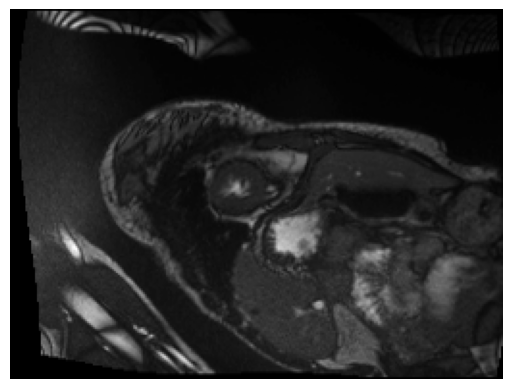

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


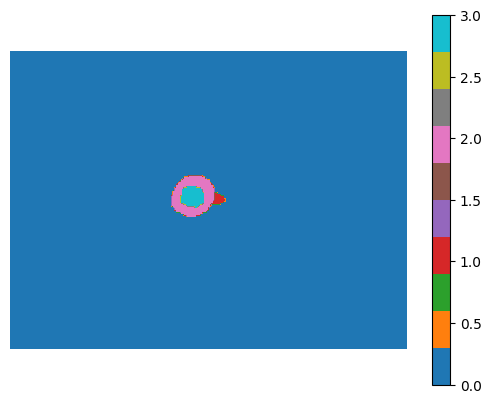

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


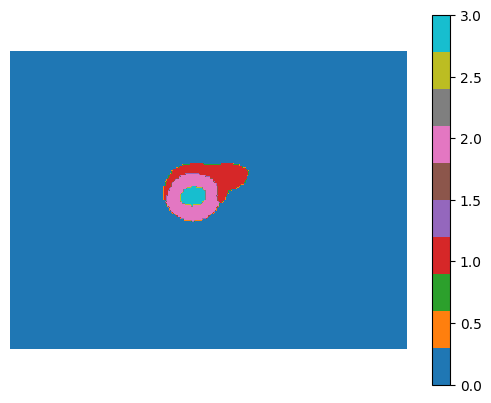

val Loss: 7.5507, Dice: 0.5048, IoU: 0.5024, Acc: 0.0024
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


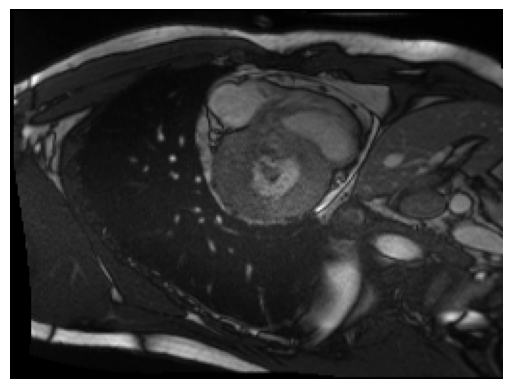

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


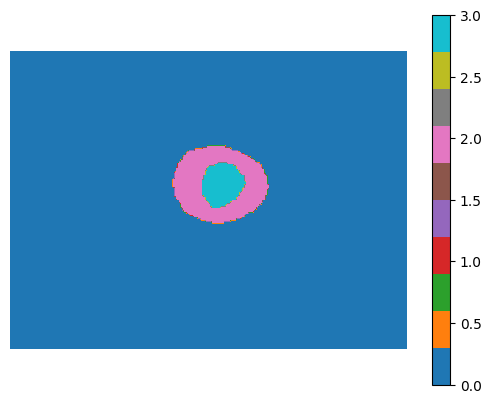

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


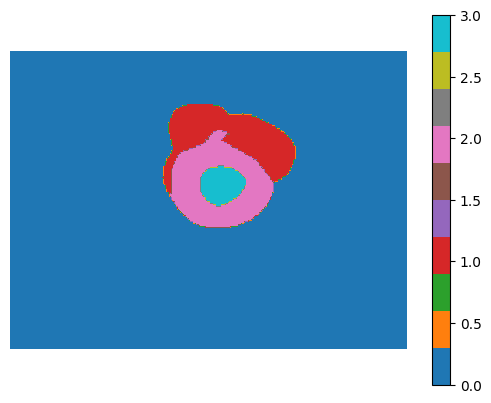

test Loss: 7.0600, Dice: 0.5051, IoU: 0.5026, Acc: 0.0026
2024-12-10 14:41:04.083105 Epoch [019/100], Step [0020/0102], [lateral-2: 1.0842, lateral-3: 3.3999, lateral-4: 1.8823]
2024-12-10 14:41:09.950675 Epoch [019/100], Step [0040/0102], [lateral-2: 1.1133, lateral-3: 3.4801, lateral-4: 1.9187]
2024-12-10 14:41:15.903432 Epoch [019/100], Step [0060/0102], [lateral-2: 1.1282, lateral-3: 3.5895, lateral-4: 1.8703]
2024-12-10 14:41:21.797908 Epoch [019/100], Step [0080/0102], [lateral-2: 1.1321, lateral-3: 3.3946, lateral-4: 1.7887]
2024-12-10 14:41:27.692196 Epoch [019/100], Step [0100/0102], [lateral-2: 1.1210, lateral-3: 3.2368, lateral-4: 1.7975]
2024-12-10 14:41:28.251084 Epoch [019/100], Step [0102/0102], [lateral-2: 1.1155, lateral-3: 3.2349, lateral-4: 1.7919]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


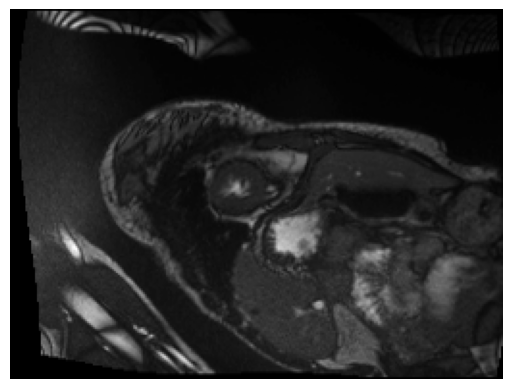

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


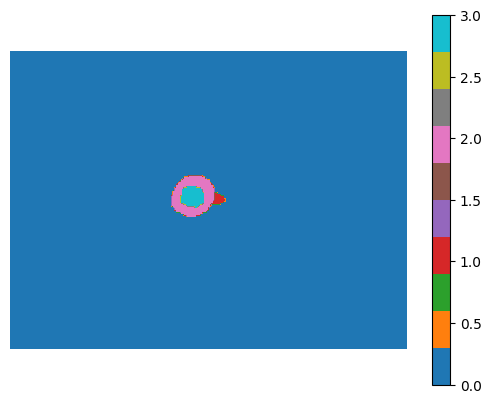

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


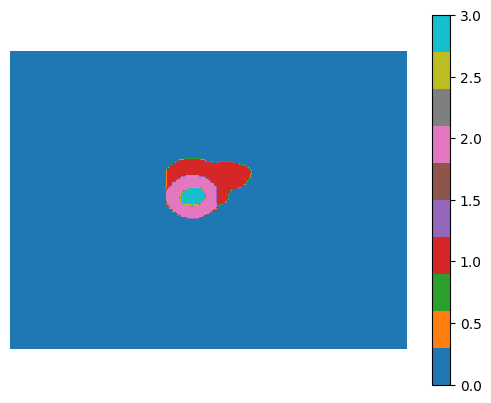

val Loss: 7.4207, Dice: 0.5144, IoU: 0.5075, Acc: 0.0075
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


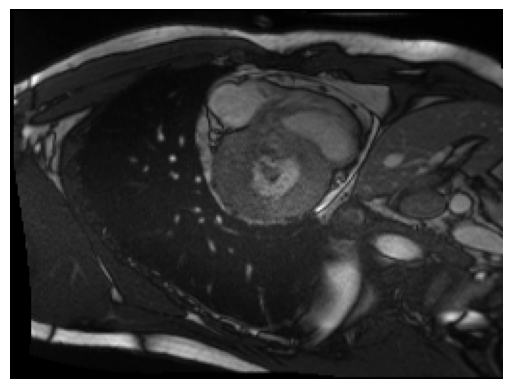

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


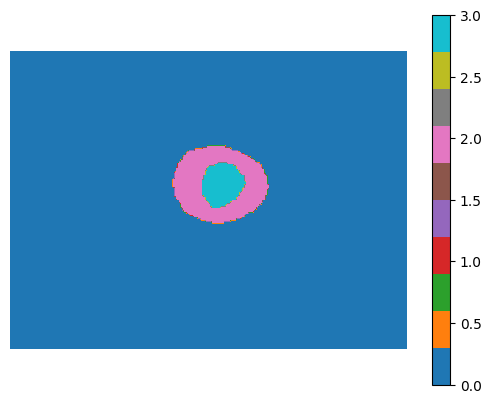

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


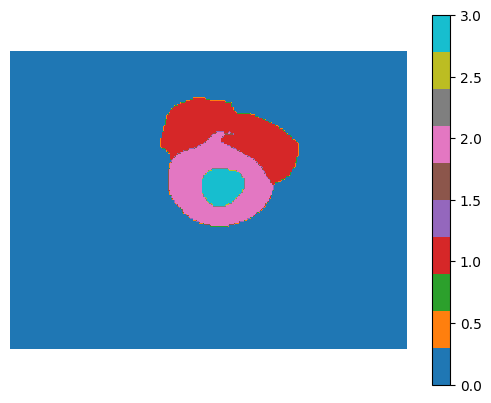

test Loss: 6.9625, Dice: 0.5157, IoU: 0.5082, Acc: 0.0082
New best loss: 7.19160461105314
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:42:14.537074 Epoch [020/100], Step [0020/0102], [lateral-2: 1.0670, lateral-3: 3.2392, lateral-4: 1.7967]
2024-12-10 14:42:20.341845 Epoch [020/100], Step [0040/0102], [lateral-2: 1.0896, lateral-3: 3.2471, lateral-4: 1.8044]
2024-12-10 14:42:26.196835 Epoch [020/100], Step [0060/0102], [lateral-2: 1.0899, lateral-3: 3.1400, lateral-4: 1.7921]
2024-12-10 14:42:32.095637 Epoch [020/100], Step [0080/0102], [lateral-2: 1.0837, lateral-3: 3.1364, lateral-4: 1.7864]
2024-12-10 14:42:37.969343 Epoch [020/100], Step [0100/0102], [lateral-2: 1.0760, lateral-3: 3.2188, lateral-4: 1.7646]
2024-12-10 14:42:38.527725 Epoch [020/100], Step [0102/0102], [lateral-2: 1.0786, lateral-3: 3.2445, lateral-4: 1.7660]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


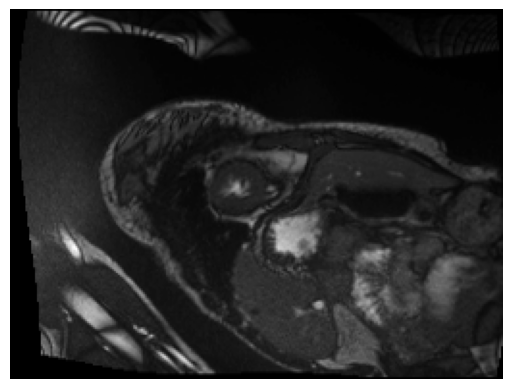

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


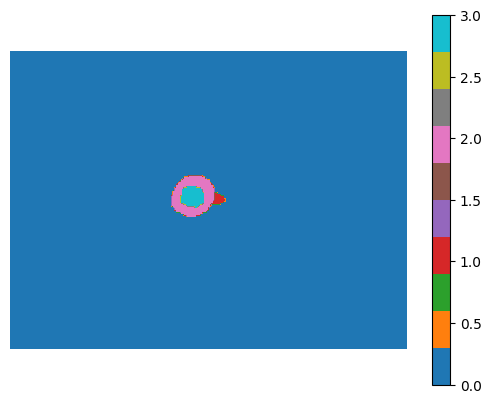

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


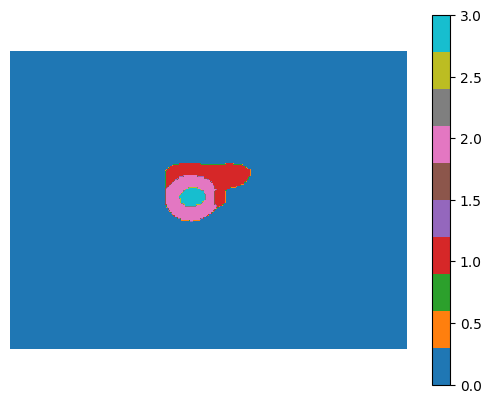

val Loss: 7.4519, Dice: 0.5142, IoU: 0.5073, Acc: 0.0073
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


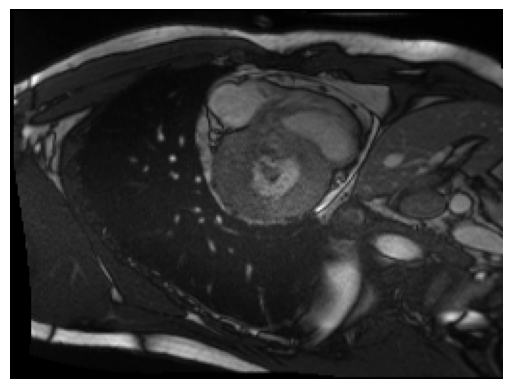

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


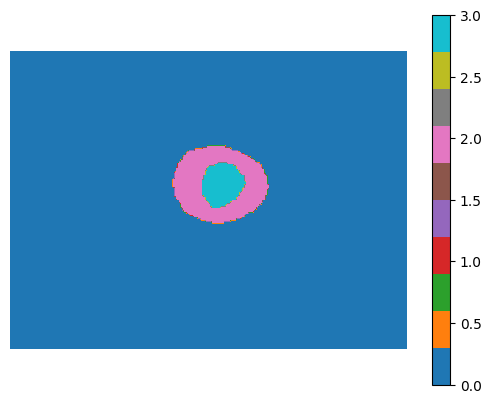

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


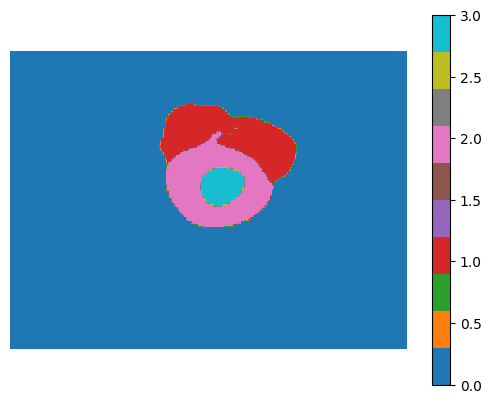

test Loss: 7.0088, Dice: 0.5133, IoU: 0.5069, Acc: 0.0069
2024-12-10 14:43:23.886544 Epoch [021/100], Step [0020/0102], [lateral-2: 1.0620, lateral-3: 3.0682, lateral-4: 1.7365]
2024-12-10 14:43:29.767032 Epoch [021/100], Step [0040/0102], [lateral-2: 1.0657, lateral-3: 3.1726, lateral-4: 1.7448]
2024-12-10 14:43:35.597195 Epoch [021/100], Step [0060/0102], [lateral-2: 1.0519, lateral-3: 3.3010, lateral-4: 1.7410]
2024-12-10 14:43:41.480310 Epoch [021/100], Step [0080/0102], [lateral-2: 1.0540, lateral-3: 3.3783, lateral-4: 1.7607]
2024-12-10 14:43:47.356713 Epoch [021/100], Step [0100/0102], [lateral-2: 1.0635, lateral-3: 3.2810, lateral-4: 1.7662]
2024-12-10 14:43:47.907999 Epoch [021/100], Step [0102/0102], [lateral-2: 1.0649, lateral-3: 3.2801, lateral-4: 1.7597]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


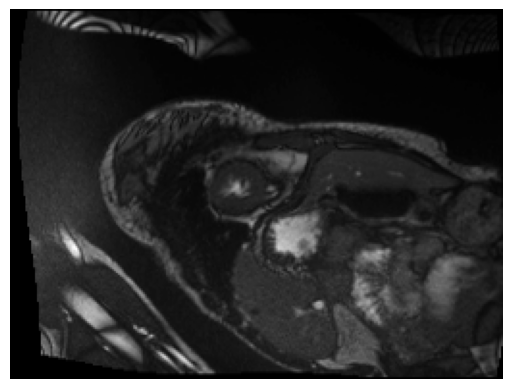

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


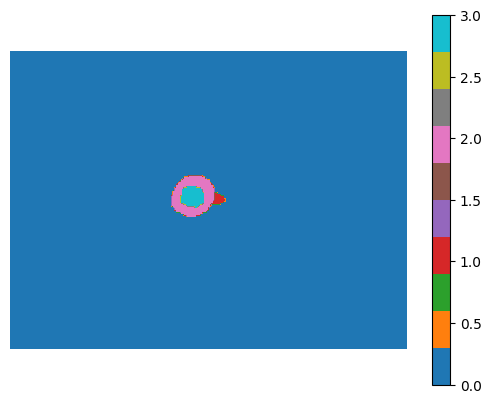

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


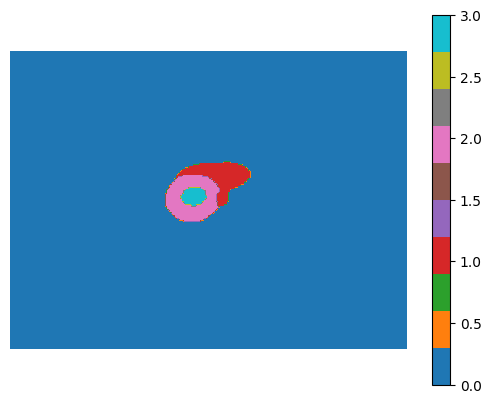

val Loss: 7.4199, Dice: 0.5181, IoU: 0.5094, Acc: 0.0094
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


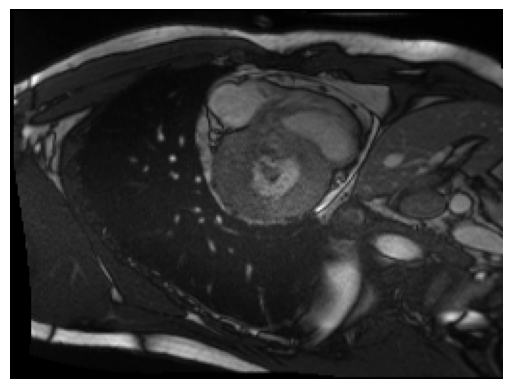

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


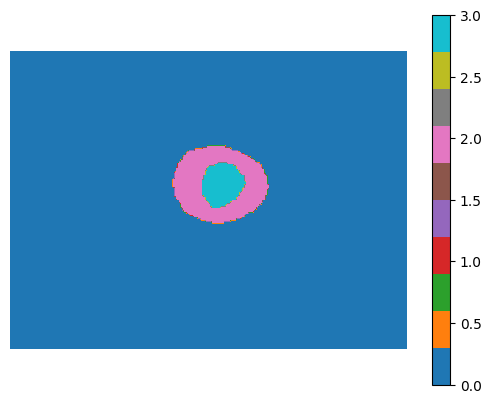

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


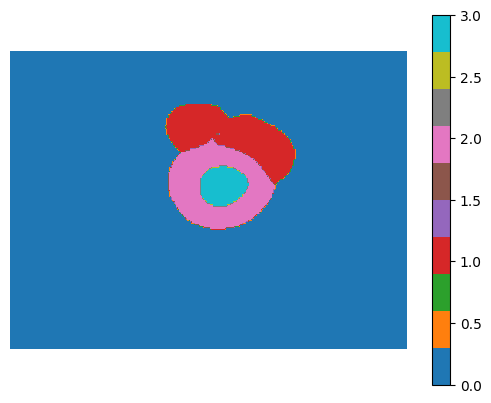

test Loss: 6.9691, Dice: 0.5201, IoU: 0.5106, Acc: 0.0106
New best loss: 7.194502067882032
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:44:33.544149 Epoch [022/100], Step [0020/0102], [lateral-2: 0.9915, lateral-3: 3.1539, lateral-4: 1.6834]
2024-12-10 14:44:39.421056 Epoch [022/100], Step [0040/0102], [lateral-2: 1.0304, lateral-3: 3.2515, lateral-4: 1.7156]
2024-12-10 14:44:45.329869 Epoch [022/100], Step [0060/0102], [lateral-2: 1.1099, lateral-3: 3.4610, lateral-4: 1.7923]
2024-12-10 14:44:51.161885 Epoch [022/100], Step [0080/0102], [lateral-2: 1.1084, lateral-3: 3.3693, lateral-4: 1.7873]
2024-12-10 14:44:57.045216 Epoch [022/100], Step [0100/0102], [lateral-2: 1.0642, lateral-3: 3.1122, lateral-4: 1.7370]
2024-12-10 14:44:57.602432 Epoch [022/100], Step [0102/0102], [lateral-2: 1.0798, lateral-3: 3.1270, lateral-4: 1.7447]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


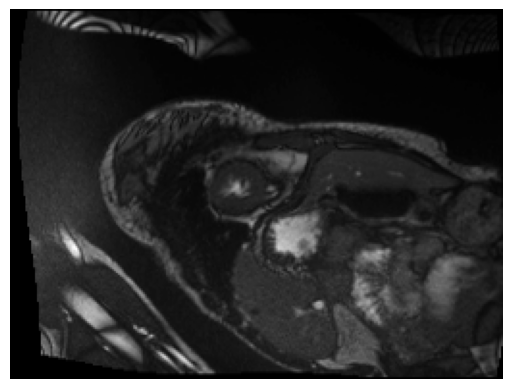

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


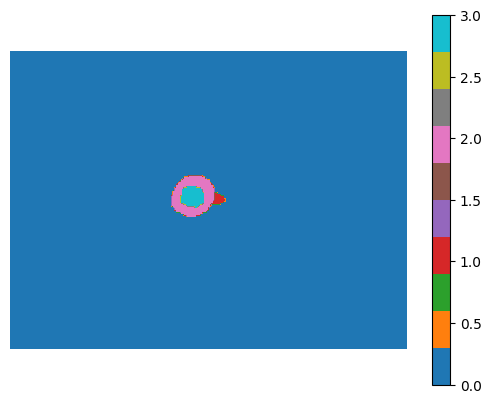

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


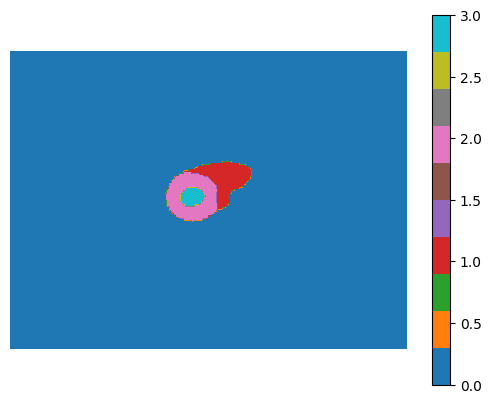

val Loss: 7.4567, Dice: 0.5266, IoU: 0.5142, Acc: 0.0142
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


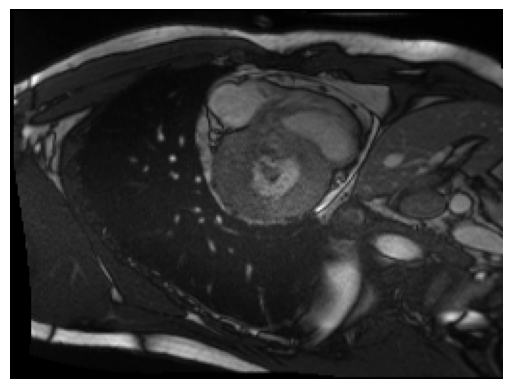

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


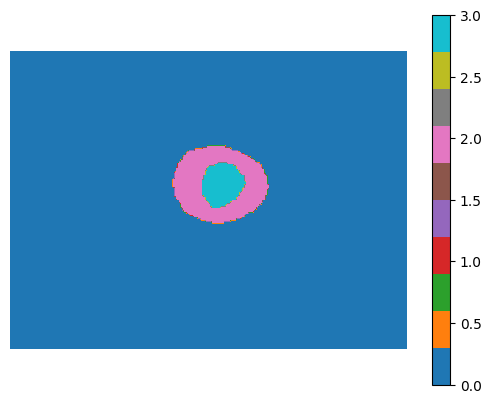

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


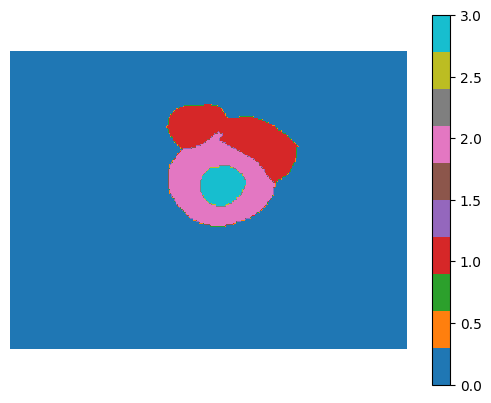

test Loss: 6.9886, Dice: 0.5295, IoU: 0.5160, Acc: 0.0160
2024-12-10 14:45:42.130139 Epoch [023/100], Step [0020/0102], [lateral-2: 1.0438, lateral-3: 3.3331, lateral-4: 1.7639]
2024-12-10 14:45:47.998962 Epoch [023/100], Step [0040/0102], [lateral-2: 1.0502, lateral-3: 3.1979, lateral-4: 1.7410]
2024-12-10 14:45:53.918735 Epoch [023/100], Step [0060/0102], [lateral-2: 1.0346, lateral-3: 3.0601, lateral-4: 1.7026]
2024-12-10 14:45:59.911664 Epoch [023/100], Step [0080/0102], [lateral-2: 1.0222, lateral-3: 3.1459, lateral-4: 1.7025]
2024-12-10 14:46:05.827849 Epoch [023/100], Step [0100/0102], [lateral-2: 1.0609, lateral-3: 3.1393, lateral-4: 1.7497]
2024-12-10 14:46:06.384602 Epoch [023/100], Step [0102/0102], [lateral-2: 1.0671, lateral-3: 3.1630, lateral-4: 1.7552]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


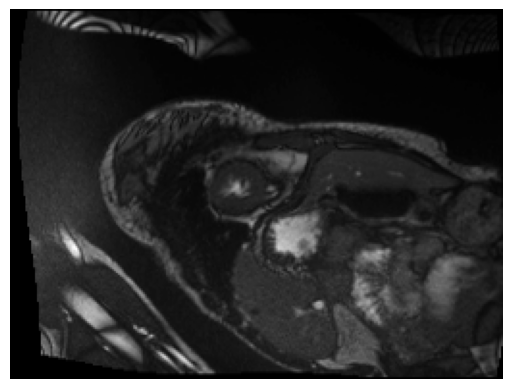

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


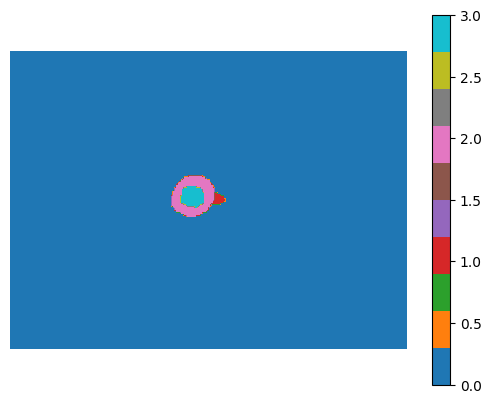

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


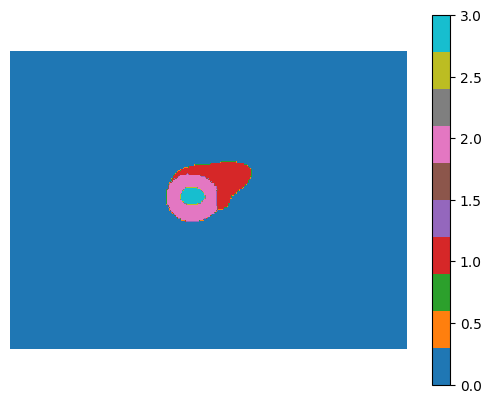

val Loss: 7.5008, Dice: 0.5356, IoU: 0.5194, Acc: 0.0194
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


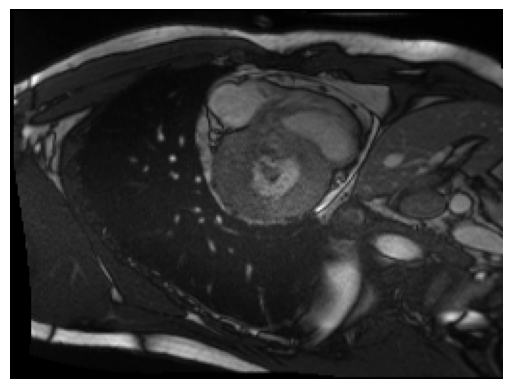

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


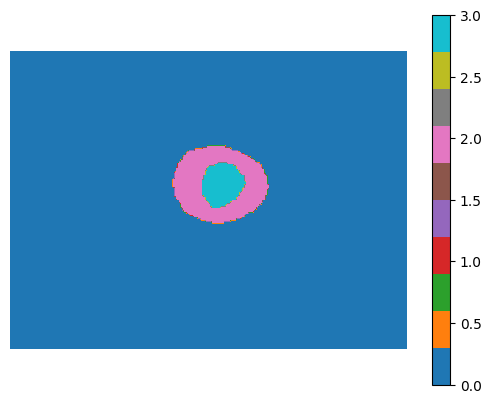

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


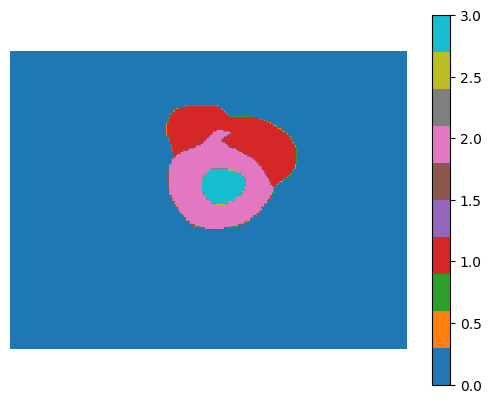

test Loss: 6.9691, Dice: 0.5380, IoU: 0.5208, Acc: 0.0208
2024-12-10 14:46:53.064843 Epoch [024/100], Step [0020/0102], [lateral-2: 1.0943, lateral-3: 3.0824, lateral-4: 1.8151]
2024-12-10 14:46:58.925077 Epoch [024/100], Step [0040/0102], [lateral-2: 1.0608, lateral-3: 3.0677, lateral-4: 1.7827]
2024-12-10 14:47:04.751481 Epoch [024/100], Step [0060/0102], [lateral-2: 1.0800, lateral-3: 3.0298, lateral-4: 1.7639]
2024-12-10 14:47:10.657235 Epoch [024/100], Step [0080/0102], [lateral-2: 1.0819, lateral-3: 2.9616, lateral-4: 1.7394]
2024-12-10 14:47:16.577930 Epoch [024/100], Step [0100/0102], [lateral-2: 1.0424, lateral-3: 3.0584, lateral-4: 1.7249]
2024-12-10 14:47:17.133188 Epoch [024/100], Step [0102/0102], [lateral-2: 1.0508, lateral-3: 3.0779, lateral-4: 1.7329]
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


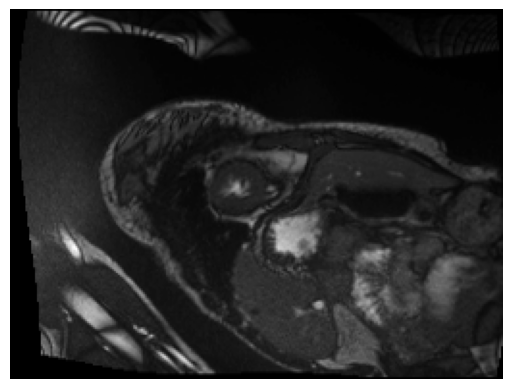

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


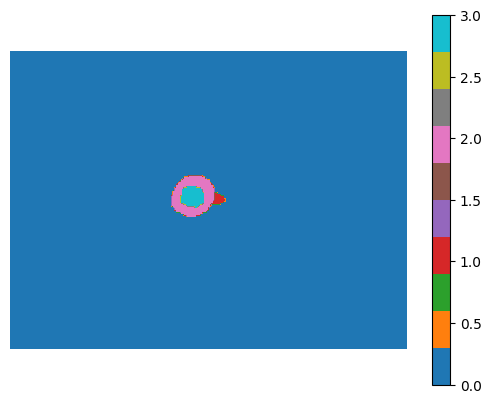

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


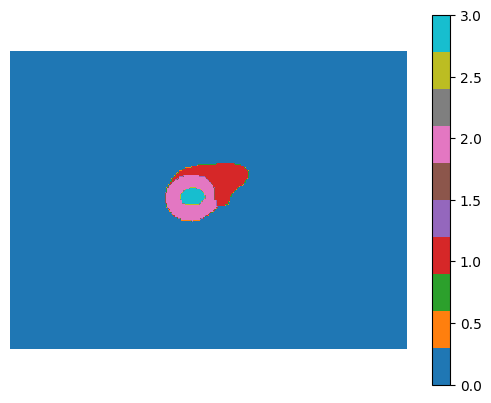

val Loss: 7.4509, Dice: 0.5504, IoU: 0.5282, Acc: 0.0282
image bef:  (3, 192, 256)
image aft:  (3, 192, 256)


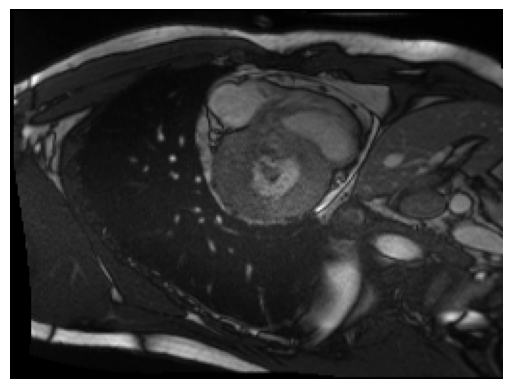

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


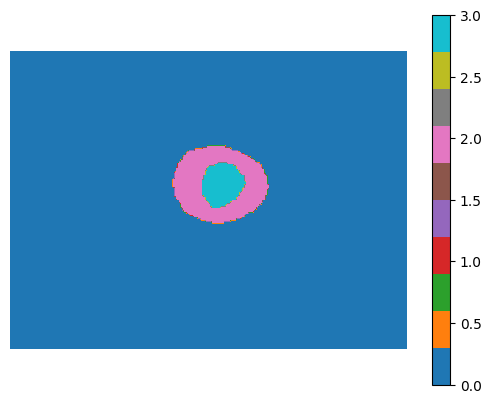

mask bef:  (4, 192, 256)
mask aft:  (4, 192, 256)


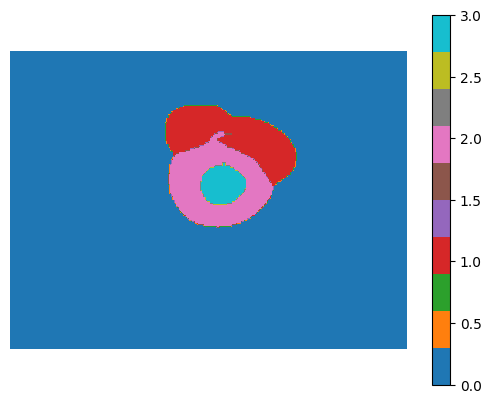

test Loss: 6.9594, Dice: 0.5525, IoU: 0.5296, Acc: 0.0296
New best loss: 7.205147551785444
[Saving Snapshot:] /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
2024-12-10 14:48:02.446708 Epoch [025/100], Step [0020/0102], [lateral-2: 1.0384, lateral-3: 2.9392, lateral-4: 1.6736]
2024-12-10 14:48:08.341196 Epoch [025/100], Step [0040/0102], [lateral-2: 1.0260, lateral-3: 2.9739, lateral-4: 1.6824]
2024-12-10 14:48:14.173156 Epoch [025/100], Step [0060/0102], [lateral-2: 1.0206, lateral-3: 2.9086, lateral-4: 1.6792]


In [ ]:
print("#"*20, "Start Training", "#"*20)

best_loss = 1e5
no_improve_epoch = 0    # number of times epoch did not improve
current_epoch = 1       # current epoch

while current_epoch < max_epoch + 1 and no_improve_epoch < stop_epoch:
    best_loss, mean_dice, mean_iou, mean_acc, no_improve_epoch = train(train_loader, model, optimizer, current_epoch, best_loss, no_improve_epoch, num_classes)

    wandb.log({
        "epoch": current_epoch,
        "loss": best_loss,
        "dice": mean_dice,
        "iou": mean_iou,
        "acc": mean_acc,
        "no_improve_epoch": no_improve_epoch,
    })

    current_epoch += 1

print("Training completed!")

## Evaluation

In [142]:
# Argument Inputs

ckpt_path = '/content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth'   # Path to the checkpoint
test_path = '/content/MIS_TransFuse_training/data'     # Path to test dataset
save_path = '/content/MIS_TransFuse_training/save'        # Path to save inference segmentation

os.makedirs(save_path, exist_ok=True)

In [143]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

num_classes = 4

model = TransFuse_S(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(ckpt_path, map_location=device))
model.eval()

if save_path is not None:
    os.makedirs(save_path, exist_ok=True)

Using device: cuda


<ipython-input-143-4a546dc170f6>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(ckpt_path, map_location=device))


In [144]:
print('Evaluating model:', ckpt_path)

image_root = f'{test_path}/data_test.npy'
gt_root = f'{test_path}/mask_test.npy'
test_loader = test_dataset(image_root, gt_root, num_classes)

# Prepare storage for predictions
all_images = []
all_gts = []
all_predictions = []

dice_bank = []
iou_bank = []
acc_bank = []

for i in range(test_loader.size):
    # Load data
    image, gt = test_loader.load_data()

    # Move image and ground truth to the device
    image = image.to(device)
    gt = gt.to(device)

    with torch.no_grad():
        _, _, res = model(image)

    # Apply softmax and threshold (for multi-class or binary)
    if num_classes > 1:
        res = res.softmax(dim=1)  # Multi-class: Apply softmax
        res = torch.argmax(res, dim=1)  # Take the class with max probability
    else:
        res = res.sigmoid()  # Binary: Apply sigmoid
        res = (res > 0.5).float()  # Binarize predictions

    res = res.cpu().numpy().squeeze()  # Convert predictions to NumPy
    gt = gt.cpu().numpy().squeeze()  # Convert ground truth to NumPy

    # Save predictions for visualization or analysis
    all_images.append(image.squeeze(0).permute(1, 2, 0).cpu().numpy())  # Convert tensor to NumPy
    all_gts.append(gt)
    all_predictions.append(res)

    if i % 100 == 0:
        print(f"Images processed: {i}")

    # Compute metrics
    dice = mean_dice_np(gt, res, num_classes=num_classes)
    iou = mean_iou_np(gt, res, num_classes=num_classes)
    acc = np.sum(res == gt) / (res.shape[0] * res.shape[1])

    dice_bank.append(dice)
    iou_bank.append(iou)
    acc_bank.append(acc)

# Save all predictions at the end
if save_path is not None:
    pred_npy_path = f'{save_path}/predicted_test.npy'
    np.save(pred_npy_path, np.array(all_predictions))  # Save predictions as NumPy file
    print(f"Predictions saved to {pred_npy_path}")

# Final metrics
print('Dice: {:.4f}, IoU: {:.4f}, Acc: {:.4f}'.
      format(np.mean(dice_bank), np.mean(iou_bank), np.mean(acc_bank)))


Evaluating model: /content/MIS_TransFuse_training/snapshots/TransFuse_S/TransFuse-S_test_best.pth
Images processed: 0
Images processed: 100
Images processed: 200
Images processed: 300
Images processed: 400
Images processed: 500
Images processed: 600
Images processed: 700
Images processed: 800
Images processed: 900
Images processed: 1000
Predictions saved to /content/MIS_TransFuse_training/save/predicted_test.npy
Dice: 0.3752, IoU: 0.1892, Acc: 2.8441


In [145]:
from scipy import stats


# Convert all predictions to a single array (flattened)
all_predictions_flat = np.concatenate(all_predictions, axis=None)

# Compute Mean
mean_value = np.mean(all_predictions_flat)

# Compute Mode
mode_value = stats.mode(all_predictions_flat)[0]

# Compute Median
median_value = np.median(all_predictions_flat)

# Compute Range (max - min)
range_value = np.max(all_predictions_flat) - np.min(all_predictions_flat)

# Output the statistics
print(f"Mean class value: {mean_value:.4f}")
print(f"Mode class value: {mode_value}")
print(f"Median class value: {median_value}")
print(f"Range of class values: {range_value}")

Mean class value: 0.1070
Mode class value: 0
Median class value: 0.0
Range of class values: 3


In [146]:
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def visualize_samples_from_npy(image_path, gt_path, pred_path, sample_count=5, num_classes=3):
    """
    Visualize random samples of images, ground truth masks, and predictions from .npy files for multi-class segmentation.

    Args:
        image_path (str): Path to the .npy file containing images.
        gt_path (str): Path to the .npy file containing ground truth masks.
        pred_path (str): Path to the .npy file containing predicted masks.
        sample_count (int): Number of samples to visualize.
        num_classes (int): Number of classes in the segmentation task.
    """
    # Load the data from .npy files
    images = np.load(image_path)  # Shape: (600, 192, 256, 3), dtype: uint8
    gts = np.load(gt_path)  # Shape: (600, 192, 256), dtype: uint8
    predictions = np.load(pred_path)  # Shape: (600, 1, 192, 256), dtype: uint8

    print(f"images: {images.shape}")
    print(f"gts: {gts.shape}")
    print(f"predictions: {predictions.shape}")

    # Remove the extra batch dimension from predictions
    if len(predictions.shape) == 4:
        predictions = predictions.squeeze(axis=1)  # Shape: (600, 192, 256)

    # Create a custom grayscale colormap
    shades_of_gray = [(i / (num_classes - 1),) * 3 for i in range(num_classes)]
    grayscale_cmap = ListedColormap(shades_of_gray)

    # Randomly sample indices
    indices = random.sample(range(len(images)), sample_count)
    for idx in indices:
        # Retrieve image, ground truth, and prediction
        image = images[idx]  # Shape: (192, 256, 3), RGB image
        gt = gts[idx]        # Shape: (192, 256), ground truth
        pred = predictions[idx]  # Shape: (192, 256), predicted mask

        # Convert image to range 0–1 for matplotlib (optional for uint8)
        image = image / 255.0

        # Display the images
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(image)
        axes[0].set_title('Original Image')

        axes[1].imshow(gt, cmap=grayscale_cmap, vmin=0, vmax=num_classes - 1)
        axes[1].set_title('Ground Truth Mask')

        axes[2].imshow(pred, cmap=grayscale_cmap, vmin=0, vmax=num_classes - 1)
        axes[2].set_title('Predicted Mask')

        for ax in axes:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

images: (1076, 192, 256, 3)
gts: (1076, 192, 256)
predictions: (1076, 192, 256)


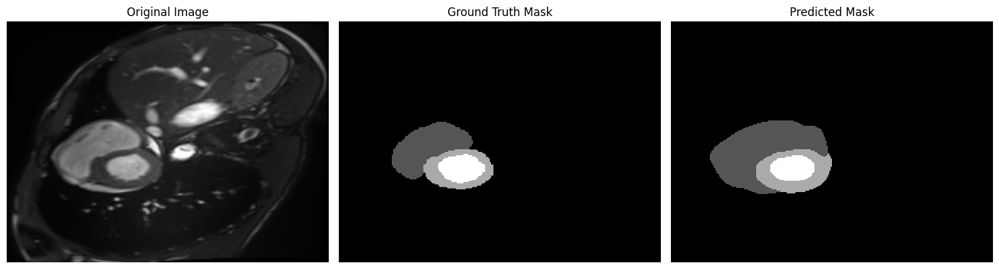

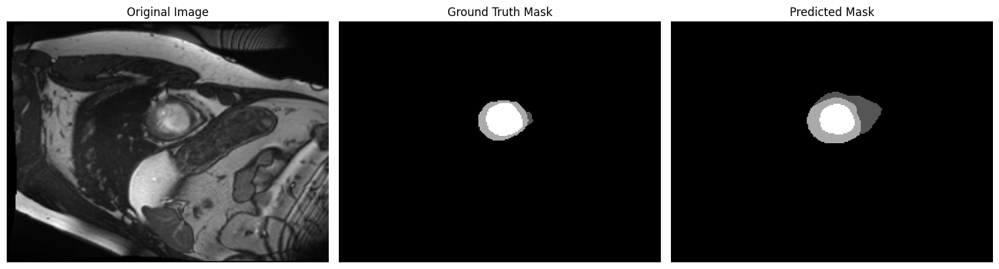

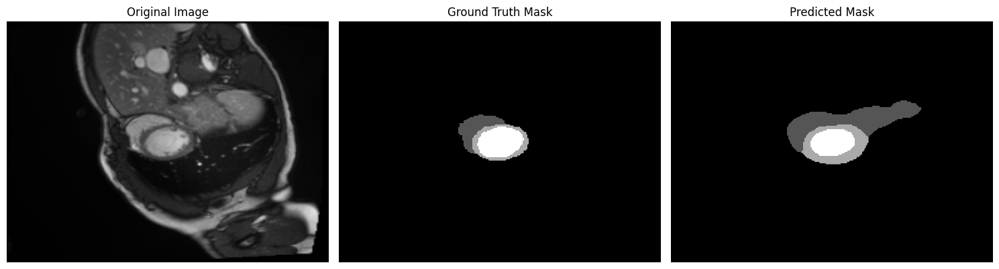

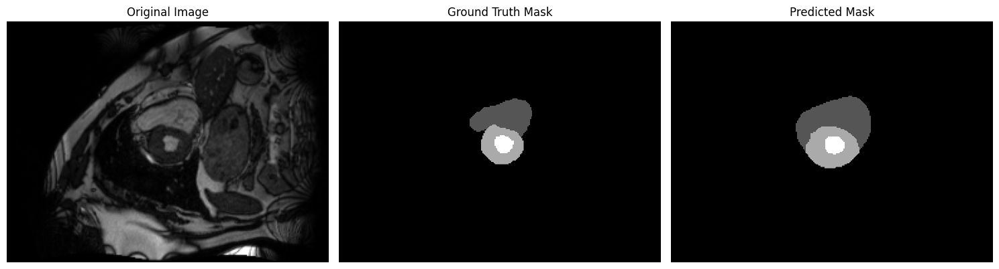

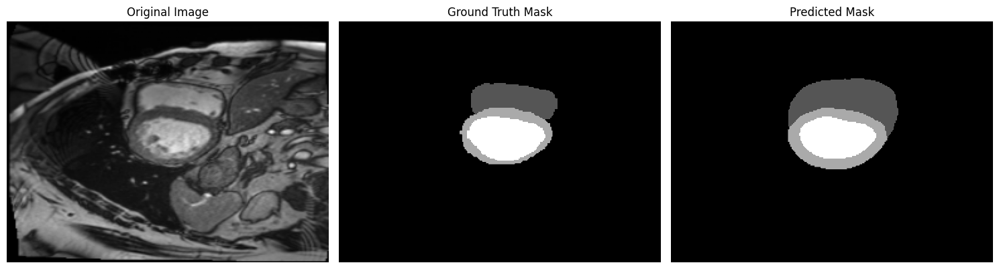

In [147]:
test_path = '/content/MIS_TransFuse_training/data'
save_path = '/content/MIS_TransFuse_training/save'

# Paths to .npy files
image_npy = f'{test_path}/data_test.npy'
gt_npy = f'{test_path}/mask_test.npy'
pred_npy = f'{save_path}/predicted_test.npy'

visualize_samples_from_npy(image_npy, gt_npy, pred_npy, sample_count=5, num_classes=num_classes)

### Sweep Train

In [ ]:
sweep_config = {
    'method': 'bayes',  # Optimization strategy: 'grid', 'random', or 'bayes'
    'metric': {'name': 'loss', 'goal': 'minimize'},
    'parameters': {
        'lr': {'values': [1e-4, 7e-5, 1e-5]},
        'batchsize': {'values': [8, 16, 32]},
        'beta1': {'values': [0.5, 0.9]},
        'beta2': {'values': [0.999, 0.98]},
        'grad_norm': {'values': [1.0, 2.0, 5.0]},
    },
}


In [ ]:
def sweep_train(config=None):
    with wandb.init(config=config):
        config = wandb.config

        # Use the parameters from the sweep config
        batchsize = config.batchsize
        lr = config.lr
        grad_norm = config.grad_norm
        beta1 = config.beta1
        beta2 = config.beta2

        # Reinitialize components with new parameters
        train_loader = get_loader(image_root, gt_root, batchsize=batchsize, num_classes=num_classes)
        model = TransFuse_S(num_classes=num_classes, pretrained=True,
                            pretrained_model=pretrained_model,
                            pretrained_transformer=pretrained_transformer).cuda()
        optimizer = torch.optim.Adam(model.parameters(), lr=lr, betas=(beta1, beta2))

        best_loss = 1e5
        no_improve_epoch = 0
        current_epoch = 1

        while current_epoch < max_epoch + 1 and no_improve_epoch < stop_epoch:
            best_loss, mean_dice, mean_iou, mean_acc, no_improve_epoch = train(train_loader, model, optimizer, current_epoch, best_loss, no_improve_epoch, num_classes)

            # Log metrics to WandB
            wandb.log({
                "epoch": current_epoch,
                "loss": best_loss,
                "dice": mean_dice,
                "iou": mean_iou,
                "acc": mean_acc,
                "no_improve_epoch": no_improve_epoch,
            })
            current_epoch += 1

In [ ]:
sweep_id = wandb.sweep(sweep_config, project="TransFuse sweep")
wandb.agent(sweep_id, sweep_train, count=20)  # Run 20 experiments